<a href="https://colab.research.google.com/github/aritonangjos/credit/blob/master/CERMATI_TEST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import json
import warnings
warnings.filterwarnings("ignore")

# Third party packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.offline import iplot

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier


sns.set(context= "notebook", color_codes=True)
plt.style.use('bmh')

pyo.init_notebook_mode()

%matplotlib inline

In [3]:
data_train = pd.read_csv("app_train.csv")
data_test = pd.read_csv("app_test.csv")
data_description = pd.read_csv("columns_description.csv")
data_installment = pd.read_csv("installment_payment.csv")
data_previous = pd.read_csv("prev_app.csv")
df = pd.concat([data_train,data_test])
# df.columns = [i.replace(" ", "_").lower() for i in df.columns]
data_train.head(10)

,Unnamed: 0,LN_ID,TARGET,CONTRACT_TYPE,GENDER,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,INCOME_TYPE,EDUCATION,FAMILY_STATUS,HOUSING_TYPE,DAYS_AGE,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,WEEKDAYS_APPLY,HOUR_APPLY,ORGANIZATION_TYPE,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3
0,201468,333538,0,Revolving loans,F,1,67500.0,202500.0,10125.0,202500.0,Working,Secondary / secondary special,Married,With parents,-11539,-921,-119.0,-2757,TUESDAY,18,Business Entity Type 3,0.572805,0.608276,NaN
1,264803,406644,0,Cash loans,F,1,202500.0,976711.5,49869.0,873000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-15743,-4482,-1797.0,-2455,TUESDAY,14,Other,0.655600,0.684298,NaN
2,137208,259130,0,Cash loans,F,0,180000.0,407520.0,25060.5,360000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-20775,365243,-8737.0,-4312,THURSDAY,14,NA1,NaN,0.580687,0.749022
3,269220,411997,0,Cash loans,M,0,225000.0,808650.0,26086.5,675000.0,State servant,Higher education,Married,House / apartment,-20659,-10455,-4998.0,-4010,WEDNESDAY,10,Culture,NaN,0.623740,0.710674
4,122096,241559,0,Revolving loans,M,0,135000.0,180000.0,9000.0,180000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-9013,-1190,-3524.0,-1644,SUNDAY,11,Construction,0.175511,0.492994,0.085595
5,169569,296530,0,Cash loans,F,2,135000.0,592560.0,32274.0,450000.0,Working,Higher education,Married,House / apartment,-10495,-744,-160.0,-152,WEDNESDAY,9,Business Entity Type 3,0.117463,0.621860,0.579727
6,143728,266655,0,Cash loans,F,0,90000.0,71109.0,5746.5,54000.0,Working,Secondary / secondary special,Married,Municipal apartment,-19417,-1672,-6784.0,-2929,TUESDAY,16,Self-employed,NaN,0.022757,0.420611
7,177332,305500,0,Cash loans,F,0,112500.0,562500.0,16578.0,562500.0,State servant,Higher education,Married,House / apartment,-16771,-1340,-7070.0,-321,TUESDAY,16,University,0.570466,0.416949,0.590233
8,6867,108004,0,Cash loans,F,1,112500.0,360000.0,17509.5,360000.0,Working,Secondary / secondary special,Married,House / apartment,-9763,-791,-1741.0,-896,MONDAY,12,Kindergarten,0.407390,0.452447,0.321735
9,113272,231371,0,Cash loans,F,1,112500.0,512446.5,34375.5,463500.0,Working,Secondary / secondary special,Civil marriage,House / apartment,-10270,-451,-1602.0,-2797,TUESDAY,16,Business Entity Type 3,0.310480,0.642651,0.466864


# BAGIAN 1 app_test, app_train, dan df

### Exploratory Data Analysis

In [ ]:
df.shape

(60736, 24)

In [ ]:
# data_train["CONTRACT_TYPE"] = data_train[(data_train["CONTRACT_TYPE"] != 0).d

In [ ]:
print(f"the shape of  data train: {data_train.shape}, the shape of  data test: {data_test.shape}, the shape of description: {data_description.shape}, the shape of installment: {data_installment.shape}, the shape of data previous: {data_previous.shape}")

the shape of  data train: (61503, 24), the shape of  data test: (14761, 24), the shape of description: (48, 3), the shape of installment: (2374140, 8), the shape of data previous: (350712, 19)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56141 entries, 0 to 14760
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         56141 non-null  int64  
 1   LN_ID              56141 non-null  int64  
 2   TARGET             56141 non-null  int64  
 3   CONTRACT_TYPE      56141 non-null  object 
 4   GENDER             56141 non-null  object 
 5   NUM_CHILDREN       56141 non-null  int64  
 6   INCOME             56141 non-null  float64
 7   APPROVED_CREDIT    56141 non-null  float64
 8   ANNUITY            56141 non-null  float64
 9   PRICE              56080 non-null  float64
 10  INCOME_TYPE        56141 non-null  object 
 11  EDUCATION          56141 non-null  object 
 12  FAMILY_STATUS      56141 non-null  object 
 13  HOUSING_TYPE       56141 non-null  object 
 14  DAYS_AGE           56141 non-null  int64  
 15  DAYS_WORK          56141 non-null  int64  
 16  DAYS_REGISTRATION  561

In [ ]:
data_description.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Table        48 non-null     object
 1   Columns      48 non-null     object
 2   Description  48 non-null     object
dtypes: object(3)
memory usage: 1.2+ KB


In [ ]:
data_installment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147144 entries, 0 to 147143
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   147144 non-null  int64  
 1   SK_ID_PREV   147144 non-null  int64  
 2   LN_ID        147144 non-null  int64  
 3   INST_NUMBER  147144 non-null  int64  
 4   INST_DAYS    147144 non-null  float64
 5   PAY_DAYS     147144 non-null  float64
 6   AMT_INST     147144 non-null  float64
 7   AMT_PAY      147143 non-null  float64
dtypes: float64(4), int64(4)
memory usage: 9.0 MB


In [ ]:
data_previous.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68144 entries, 0 to 68143
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 68144 non-null  int64  
 1   SK_ID_PREV                 68144 non-null  int64  
 2   LN_ID                      68144 non-null  int64  
 3   CONTRACT_TYPE              68144 non-null  object 
 4   ANNUITY                    53588 non-null  float64
 5   APPLICATION                68144 non-null  float64
 6   APPROVED_CREDIT            68144 non-null  float64
 7   AMT_DOWN_PAYMENT           32691 non-null  float64
 8   PRICE                      53089 non-null  float64
 9   WEEKDAYS_APPLY             68144 non-null  object 
 10  HOUR_APPLY                 68144 non-null  int64  
 11  CONTRACT_STATUS            68144 non-null  object 
 12  DAYS_DECISION              68143 non-null  float64
 13  TERM_PAYMENT               53587 non-null  flo

In [ ]:
data_train.isnull().sum()

Unnamed: 0               0
LN_ID                    0
TARGET                   0
CONTRACT_TYPE            0
GENDER                   0
NUM_CHILDREN             0
INCOME                   0
APPROVED_CREDIT          0
ANNUITY                  0
PRICE                   35
INCOME_TYPE              0
EDUCATION                0
FAMILY_STATUS            0
HOUSING_TYPE             0
DAYS_AGE                 1
DAYS_WORK                1
DAYS_REGISTRATION        1
DAYS_ID_CHANGE           1
WEEKDAYS_APPLY           1
HOUR_APPLY               1
ORGANIZATION_TYPE        1
EXT_SCORE_1          20849
EXT_SCORE_2             79
EXT_SCORE_3           7387
dtype: int64

In [ ]:
data_test.isnull().sum()

Unnamed: 0              0
LN_ID                   0
TARGET                  0
CONTRACT_TYPE           0
GENDER                  0
NUM_CHILDREN            0
INCOME                  0
APPROVED_CREDIT         0
ANNUITY                 0
PRICE                  20
INCOME_TYPE             0
EDUCATION               0
FAMILY_STATUS           0
HOUSING_TYPE            0
DAYS_AGE                0
DAYS_WORK               0
DAYS_REGISTRATION       0
DAYS_ID_CHANGE          0
WEEKDAYS_APPLY          0
HOUR_APPLY              0
ORGANIZATION_TYPE       0
EXT_SCORE_1          8312
EXT_SCORE_2            19
EXT_SCORE_3          2919
dtype: int64

In [ ]:
data_train = data_train.fillna(0)
data_test = data_test.fillna(0)
df = df.fillna(0)

In [ ]:
df_summary = df.describe()
df.describe()

,Unnamed: 0,LN_ID,TARGET,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,DAYS_AGE,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,HOUR_APPLY,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3
count,9188.000000,9188.000000,9188.000000,9188.000000,9.188000e+03,9.188000e+03,9188.000000,9.188000e+03,9188.000000,9188.000000,9188.000000,9188.000000,9188.000000,9188.000000,9188.000000,9188.000000
mean,155227.408032,279885.793970,0.078472,0.412930,1.685565e+05,5.949138e+05,27121.980953,5.340390e+05,-16003.605899,62919.294841,-4945.831084,-3002.266434,12.109055,0.221463,0.518685,0.406193
std,88523.416403,102504.914228,0.268927,0.713531,1.018139e+05,4.029827e+05,14528.310906,3.693875e+05,4395.018083,140579.975400,3490.373187,1518.044796,3.299906,0.286560,0.188888,0.269995
min,6.000000,100009.000000,0.000000,0.000000,3.105000e+04,4.500000e+04,2164.500000,0.000000e+00,-25165.000000,-15911.000000,-19695.000000,-6207.000000,0.000000,0.000000,0.000000,0.000000
25%,78521.500000,191032.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,16537.500000,2.385000e+05,-19700.000000,-2790.000000,-7451.250000,-4312.000000,10.000000,0.000000,0.401632,0.164414
50%,155764.500000,280556.000000,0.000000,0.000000,1.485000e+05,5.084955e+05,24835.500000,4.500000e+05,-15690.500000,-1232.000000,-4521.000000,-3291.000000,12.000000,0.000000,0.568066,0.456110
75%,231787.500000,368473.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34544.250000,6.795000e+05,-12343.750000,-308.000000,-1946.000000,-1697.500000,15.000000,0.464770,0.666326,0.636376
max,307510.000000,456255.000000,1.000000,6.000000,3.150000e+06,4.031032e+06,225000.000000,3.712500e+06,0.000000,365243.000000,0.000000,0.000000,23.000000,0.937500,0.818404,0.882530


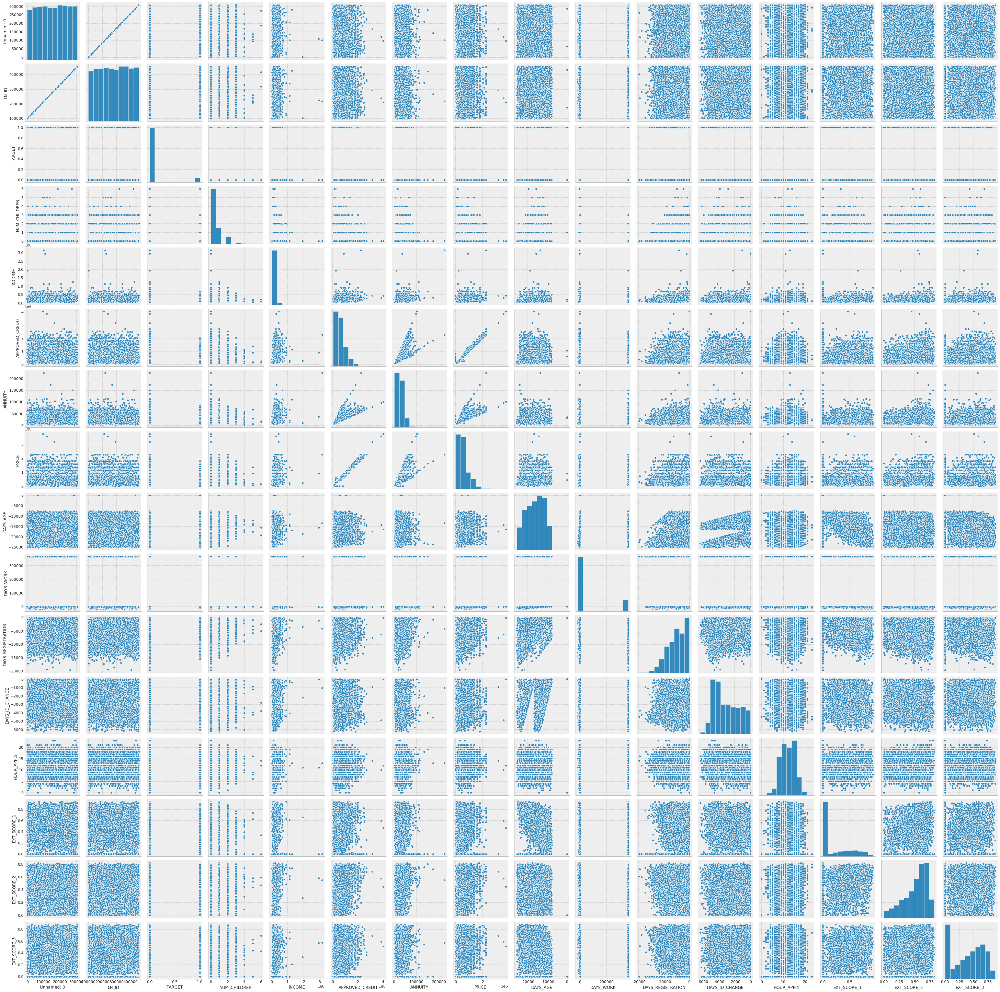

In [ ]:
sns.pairplot(df);

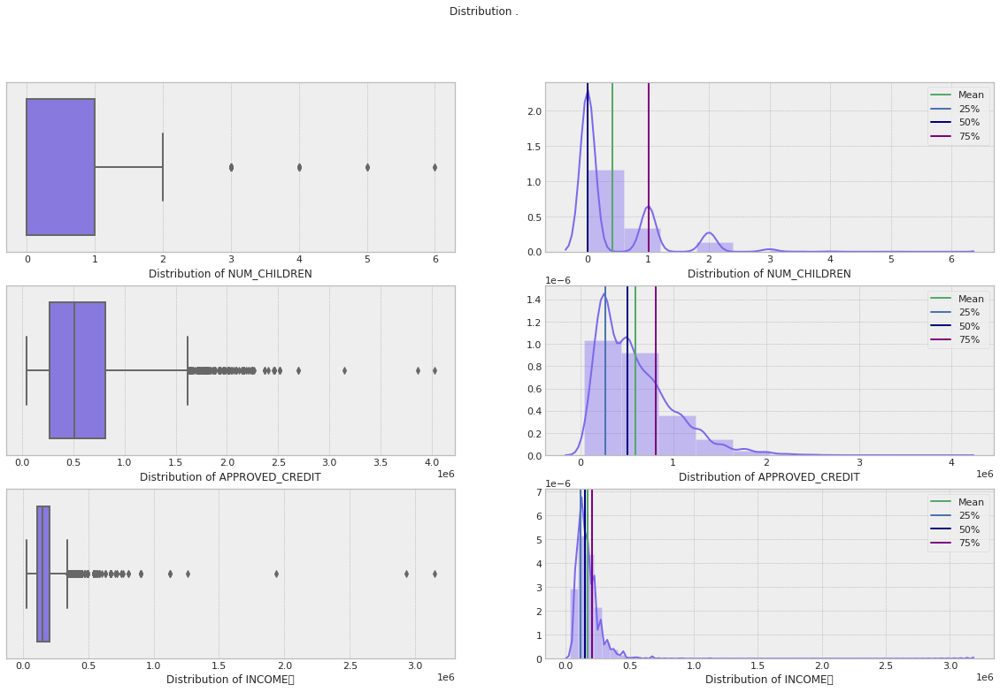

In [ ]:
def draw_axvlines(plt, col):
    mean = df_summary.loc["mean", col]
    q1 = df_summary.loc["25%", col]
    q2 = df_summary.loc["50%", col]
    q3 = df_summary.loc["75%", col]
    plt.axvline(mean, color = "g");              # Plotting a line to mark the mean 
    plt.axvline(q1, color = "b");                # Plotting a line to mark Q1 
    plt.axvline(q2, color = "navy");             # Plotting a line to mark Q2 
    plt.axvline(q3, color = "purple");           # Plotting a line to mark Q3
    plt.legend({"Mean": mean, "25%" : q1, "50%" : q2, "75%" : q3});

fig, axes = plt.subplots(3, 2, figsize = (20,12));
fig.suptitle('Distribution .');


# distribution of NUM_CHILDREN
sns.boxplot(df["NUM_CHILDREN"], ax = axes[0][0], color = "mediumslateblue");
axes[0][0].set(xlabel = 'Distribution of NUM_CHILDREN');

pp = sns.distplot(df["NUM_CHILDREN"], ax = axes[0][1], bins = 10, color = "mediumslateblue");
axes[0][1].set(xlabel = 'Distribution of NUM_CHILDREN');
draw_axvlines(pp, "NUM_CHILDREN");


# distribution of APPROVED_CREDIT
sns.boxplot(df["APPROVED_CREDIT"], ax = axes[1][0], color = "mediumslateblue");
axes[1][0].set(xlabel = 'Distribution of APPROVED_CREDIT');

pp = sns.distplot(df["APPROVED_CREDIT"], ax = axes[1][1], bins = 10, color = "mediumslateblue");
axes[1][1].set(xlabel = 'Distribution of APPROVED_CREDIT');
draw_axvlines(pp, "APPROVED_CREDIT")


# distribution of Income
sns.boxplot(df["INCOME"], ax = axes[2][0], color = "mediumslateblue");
axes[2][0].set(xlabel = 'Distribution of INCOME	');

pp = sns.distplot(df["INCOME"], ax = axes[2][1], color = "mediumslateblue");
axes[2][1].set(xlabel = 'Distribution of INCOME	');
draw_axvlines(pp, "INCOME")

In [ ]:
train_df = df.drop(columns=['LN_ID','WEEKDAYS_APPLY','Unnamed: 0']) ## Dropping Loan ID
categorical_columns = ['GENDER', 'INCOME_TYPE', 'EDUCATION', 'FAMILY_STATUS', 'HOUSING_TYPE', 'ORGANIZATION_TYPE','TARGET','CONTRACT_TYPE']
#categorical_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area','Loan_Amount_Term']

print(categorical_columns)
numerical_columns = ['NUM_CHILDREN', 'INCOME', 'APPROVED_CREDIT','ANNUITY','PRICE']
print(numerical_columns)

['GENDER', 'INCOME_TYPE', 'EDUCATION', 'FAMILY_STATUS', 'HOUSING_TYPE', 'ORGANIZATION_TYPE', 'TARGET', 'CONTRACT_TYPE']
['NUM_CHILDREN', 'INCOME', 'APPROVED_CREDIT', 'ANNUITY', 'PRICE']


In [ ]:
fig,axes = plt.subplots(4,2,figsize=(12,15))
for idx,cat_col in enumerate(categorical_columns):
    row,col = idx//2,idx%2
    sns.countplot(x=cat_col,data=train_df,hue='Loan_Status',ax=axes[row,col])


plt.subplots_adjust(hspace=1)

Change the Cash Loans = 1
Change the Revolving Loans = 0

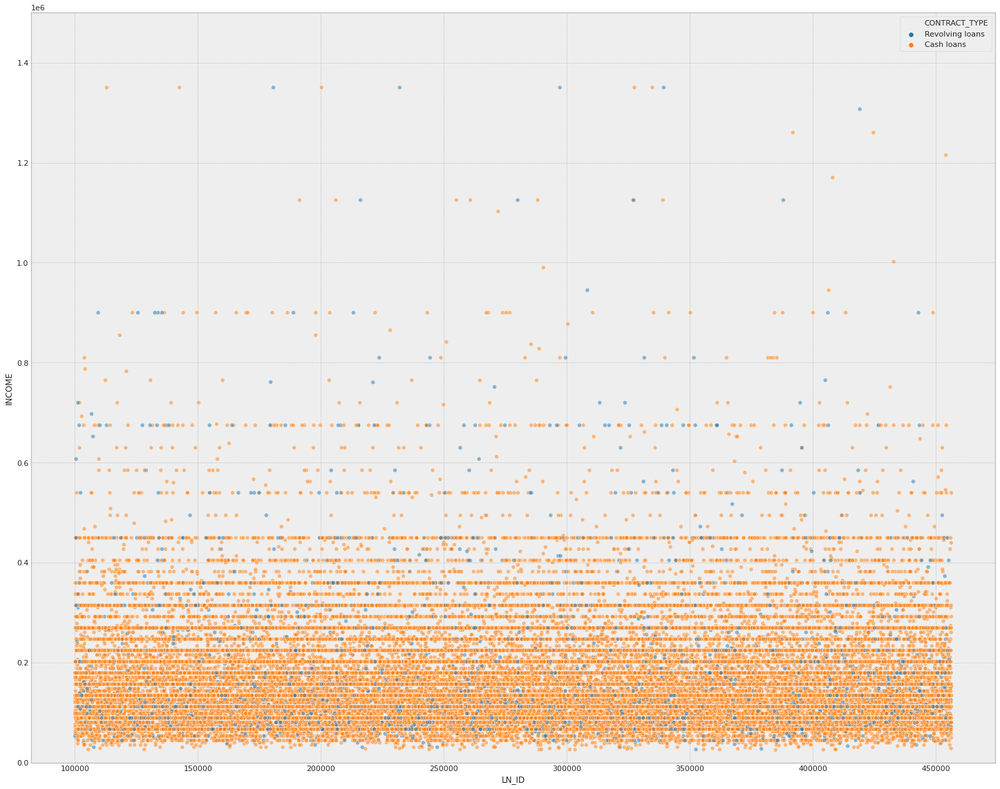

In [ ]:
plt.figure(figsize=(25,20))
plt.ylim(0,1500000)
sns.scatterplot(x = "LN_ID", y = "INCOME", data=df, hue = "CONTRACT_TYPE", palette="tab10", alpha = 0.5);

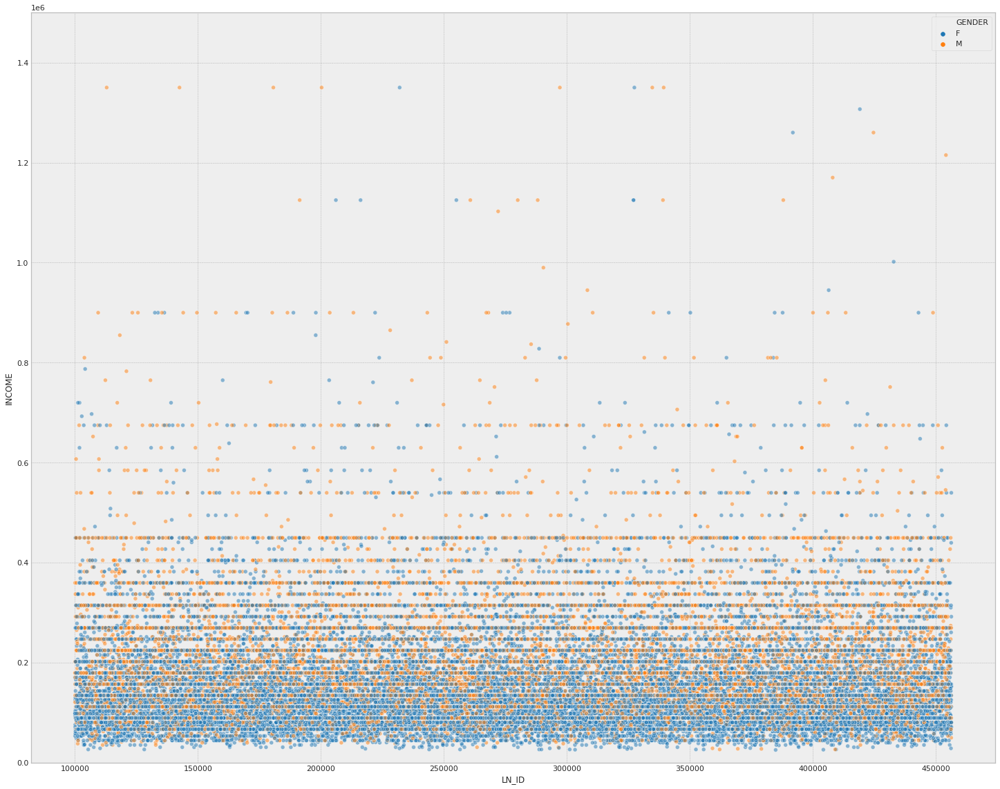

In [ ]:
plt.figure(figsize=(25,20))
plt.ylim(0,1500000)
sns.scatterplot(x = "LN_ID", y = "INCOME", data=df, hue = "GENDER", palette="tab10", alpha = 0.5);

In [ ]:
def groupby_get_cc_count(tdf, col):
    tdf = tdf.groupby([col, "CONTRACT_TYPE"])["CONTRACT_TYPE"].count().reset_index(level = 0)
    tdf.columns = [col, "count"]
    tdf = tdf.reset_index()
    return tdf

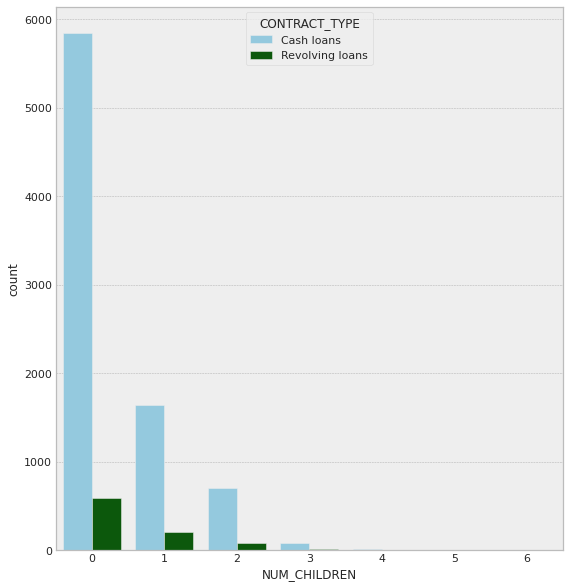

In [ ]:
fig, axes = plt.subplots(1,1, figsize=(20, 10))
xx = df["NUM_CHILDREN"].value_counts().reset_index()
xx["index"] = xx["index"].astype(str)
xx["family_perc"] = xx["NUM_CHILDREN"].apply(lambda x : round((x/5000)*100, 2))

plt.subplot(1, 2, 2)
xx = groupby_get_cc_count(df[["NUM_CHILDREN", "CONTRACT_TYPE"]], "NUM_CHILDREN")
sns.barplot(xx["NUM_CHILDREN"], xx["count"], hue = xx["CONTRACT_TYPE"], palette = ["skyblue", "darkgreen"]);
plt.show();

In [ ]:
df['FAMILY_STATUS'].value_counts().agg('')

76264

In [ ]:
df['DAYS_AGE'] = df['DAYS_AGE']/-365

[Text(0, 0, '0'),
 Text(0, 0, 'FRIDAY'),
 Text(0, 0, 'MONDAY'),
 Text(0, 0, 'SATURDAY'),
 Text(0, 0, 'SUNDAY'),
 Text(0, 0, 'THURSDAY'),
 Text(0, 0, 'TUESDAY'),
 Text(0, 0, 'WEDNESDAY')]

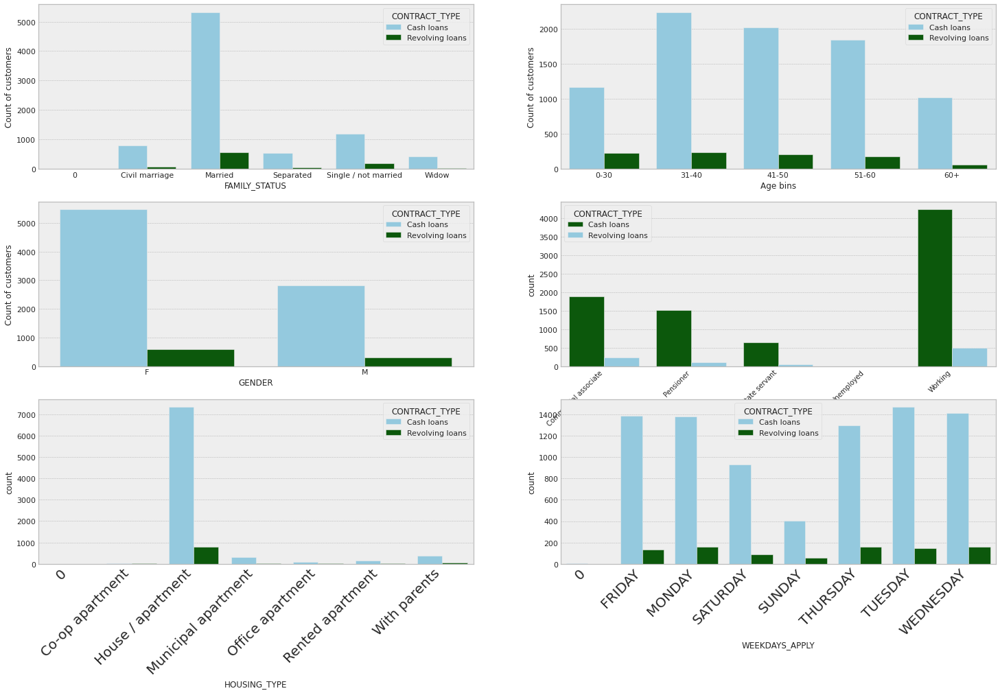

In [ ]:
fig, axes = plt.subplots(3, 2, figsize = (25,15))

# Distribution of FAMILY_STATUS
xx = groupby_get_cc_count(df[["FAMILY_STATUS", "CONTRACT_TYPE"]], "FAMILY_STATUS")
# d_dict = {1 : "Married", 2 : "Single / not married", 3 : "Civil marriage"}
# xx["STATUS"] = xx["FAMILY_STATUS"].apply(lambda x : d_dict[x])
ax = sns.barplot(xx["FAMILY_STATUS"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[0][0], palette= ["skyblue", "darkgreen"]);
ax.set(xlabel = 'FAMILY_STATUS', ylabel = 'Count of customers');

# Distribution of Age
df['age_bin'] = pd.cut(df['DAYS_AGE'], bins = [0, 30, 40, 50, 60, 100], labels = ['0-30', '31-40', '41-50', '51-60', '60+'])
xx = groupby_get_cc_count(df[["age_bin", "CONTRACT_TYPE"]], "age_bin")
ax = sns.barplot(xx["age_bin"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[0][1], palette= ["skyblue", "darkgreen"]);
ax.set(xlabel = 'Age bins', ylabel = 'Count of customers');

# Distribution of GENDER
xx = groupby_get_cc_count(df[["GENDER", "CONTRACT_TYPE"]], "GENDER")
# d_dict = {1 : "Married", 2 : "Single / not married", 3 : "Civil marriage"}
# xx["STATUS"] = xx["FAMILY_STATUS"].apply(lambda x : d_dict[x])
ax = sns.barplot(xx["GENDER"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[1][0], palette= ["skyblue", "darkgreen"]);
ax.set(xlabel = 'GENDER', ylabel = 'Count of customers');

# Distribution of INCOME_TYPE
xx = groupby_get_cc_count(df[["INCOME_TYPE", "CONTRACT_TYPE"]], "INCOME_TYPE")
# d_dict = {1 : "Married", 2 : "Single / not married", 3 : "Civil marriage"}
# xx["STATUS"] = xx["FAMILY_STATUS"].apply(lambda x : d_dict[x])
ax = sns.barplot(xx["INCOME_TYPE"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[1][1], palette= ["darkgreen","skyblue"]);
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", size=10);

# Distribution of HOUSING_TYPE	
xx = groupby_get_cc_count(df[["HOUSING_TYPE", "CONTRACT_TYPE"]], "HOUSING_TYPE")
# d_dict = {1 : "Married", 2 : "Single / not married", 3 : "Civil marriage"}
# xx["STATUS"] = xx["FAMILY_STATUS"].apply(lambda x : d_dict[x])
ax = sns.barplot(xx["HOUSING_TYPE"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[2][0], palette= ["skyblue", "darkgreen"]);
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", size=20)


# Distribution of HWEEKDAYS_APPLY	
xx = groupby_get_cc_count(df[["WEEKDAYS_APPLY", "CONTRACT_TYPE"]], "WEEKDAYS_APPLY")
# d_dict = {1 : "MONDAY", 2 : "TUESDAY", 3 : "WEDNESDAY", 4 : "THURSDAY", 5  : "FRIDAY", 6 : "SATURDAY", 7 : "SUNDAY"}
# xx["WEEKDAYS_APPLY"] = xx["WEEKDAYS_APPLY"].apply(lambda x : d_dict[x])
ax = sns.barplot(xx["WEEKDAYS_APPLY"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[2][1], palette= ["skyblue", "darkgreen"]);
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", size=20)





# # Distribution of Mortgage
# df['mtg_bin'] = pd.cut(df['mortgage'], bins = [0, 200, 400, 600, 800], labels = ['0-200', '200-400', '400-600', '600-800'])
# xx = groupby_get_cc_count(df[["mtg_bin", "CONTRACT_TYPE"]], "mtg_bin")
# ax = sns.barplot(xx["mtg_bin"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[1][0], palette= ["skyblue", "darkgreen"]);
# ax.set(xlabel = 'Mortgage bins', ylabel = 'Count of customers');

# # Distribution of CCAvg
# df['ccavg_bin'] = pd.cut(df['ccavg'], bins = [0, 2, 4, 6, 100], labels = ['0-2', '3-4', '5-6', '7+'])
# xx = groupby_get_cc_count(df[["ccavg_bin", "CONTRACT_TYPE"]], "ccavg_bin")
# ax = sns.barplot(xx["ccavg_bin"], xx["count"], hue = xx["CONTRACT_TYPE"], ax = axes[1][1], palette= ["skyblue", "darkgreen"]);
# ax.set(xlabel = 'Credit card avg spend bins', ylabel = 'Count of customers');

[Text(0, 0, '0'),
 Text(0, 0, 'Advertising'),
 Text(0, 0, 'Agriculture'),
 Text(0, 0, 'Bank'),
 Text(0, 0, 'Business Entity Type 1'),
 Text(0, 0, 'Business Entity Type 2'),
 Text(0, 0, 'Business Entity Type 3'),
 Text(0, 0, 'Cleaning'),
 Text(0, 0, 'Construction'),
 Text(0, 0, 'Culture'),
 Text(0, 0, 'Electricity'),
 Text(0, 0, 'Emergency'),
 Text(0, 0, 'Government'),
 Text(0, 0, 'Hotel'),
 Text(0, 0, 'Housing'),
 Text(0, 0, 'Industry: type 1'),
 Text(0, 0, 'Industry: type 10'),
 Text(0, 0, 'Industry: type 11'),
 Text(0, 0, 'Industry: type 12'),
 Text(0, 0, 'Industry: type 13'),
 Text(0, 0, 'Industry: type 2'),
 Text(0, 0, 'Industry: type 3'),
 Text(0, 0, 'Industry: type 4'),
 Text(0, 0, 'Industry: type 5'),
 Text(0, 0, 'Industry: type 6'),
 Text(0, 0, 'Industry: type 7'),
 Text(0, 0, 'Industry: type 9'),
 Text(0, 0, 'Insurance'),
 Text(0, 0, 'Kindergarten'),
 Text(0, 0, 'Legal Services'),
 Text(0, 0, 'Medicine'),
 Text(0, 0, 'Military'),
 Text(0, 0, 'Mobile'),
 Text(0, 0, 'NA1'),
 Tex

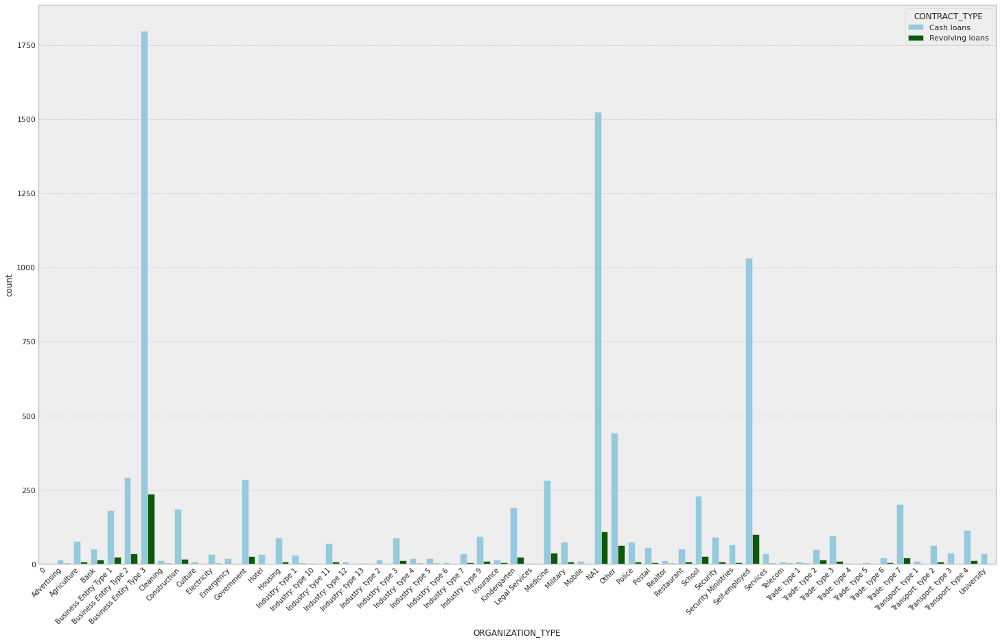

In [ ]:
fig, axes = plt.subplots(figsize=(25,15))
# Distribution of ORGANIZATION_TYPE	
xx = groupby_get_cc_count(df[["ORGANIZATION_TYPE", "CONTRACT_TYPE"]], "ORGANIZATION_TYPE")
# d_dict = {1 : "Married", 2 : "Single / not married", 3 : "Civil marriage"}
# xx["STATUS"] = xx["FAMILY_STATUS"].apply(lambda x : d_dict[x])
ax = sns.barplot(xx["ORGANIZATION_TYPE"], xx["count"], hue = xx["CONTRACT_TYPE"], palette= ["skyblue", "darkgreen"]);
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", size=10)


[Text(0, 0, 'Approved'),
 Text(0, 0, 'Canceled'),
 Text(0, 0, 'Refused'),
 Text(0, 0, 'Unused offer')]

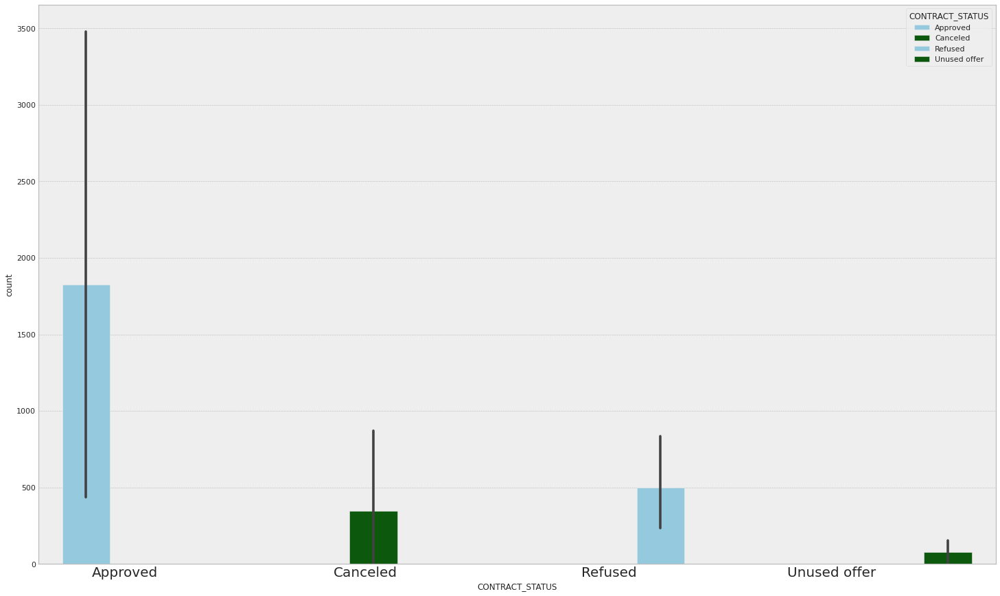

In [ ]:
fig, axes = plt.subplots(figsize=(25,15))
# Distribution of HWEEKDAYS_APPLY	
bx = groupby_get_cc_count(data_previous[["CONTRACT_STATUS", "CONTRACT_TYPE"]], "CONTRACT_STATUS")
# d_dict = {1 : "MONDAY", 2 : "TUESDAY", 3 : "WEDNESDAY", 4 : "THURSDAY", 5  : "FRIDAY", 6 : "SATURDAY", 7 : "SUNDAY"}
# xx["WEEKDAYS_APPLY"] = xx["WEEKDAYS_APPLY"].apply(lambda x : d_dict[x])
ax = sns.barplot(bx["CONTRACT_STATUS"], bx["count"], hue = bx["CONTRACT_STATUS"], palette= ["skyblue", "darkgreen"]);
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha="right", size=20)


In [ ]:
data_installment.head()

,Unnamed: 0,SK_ID_PREV,LN_ID,INST_NUMBER,INST_DAYS,PAY_DAYS,AMT_INST,AMT_PAY
0,5,1137312,164489,12,-1384.0,-1417.0,5970.375,5970.375
1,8,2723183,112102,14,-197.0,-197.0,70.740,70.740
2,11,2558880,154793,8,-1262.0,-1269.0,15031.080,15031.080
3,17,1410565,197687,1,-1037.0,-1048.0,12514.050,12510.450
4,18,2391610,183431,20,-1680.0,-1693.0,7875.000,7875.000


In [ ]:
data_previous.head()

,Unnamed: 0,SK_ID_PREV,LN_ID,CONTRACT_TYPE,ANNUITY,APPLICATION,APPROVED_CREDIT,AMT_DOWN_PAYMENT,PRICE,WEEKDAYS_APPLY,HOUR_APPLY,CONTRACT_STATUS,DAYS_DECISION,TERM_PAYMENT,YIELD_GROUP,FIRST_DRAW,FIRST_DUE,TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Approved,-73,12.0,middle,365243.0,-42.0,-37.0,0.0
1,3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Approved,-512,12.0,middle,365243.0,-482.0,-177.0,1.0
2,5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,Approved,-684,18.0,low_normal,365243.0,-654.0,-137.0,1.0
3,6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,Canceled,-14,NaN,NA1,NaN,NaN,NaN,NaN
4,10,1715995,447712,Cash loans,11368.620,270000.0,335754.0,NaN,270000.0,FRIDAY,7,Approved,-735,54.0,low_normal,365243.0,-705.0,-334.0,1.0


In [ ]:
merged = data_previous.merge(data_installment, on='SK_ID_PREV')
merged = merged.fillna(0)
merged.head(10)

,Unnamed: 0_x,SK_ID_PREV,LN_ID_x,CONTRACT_TYPE,ANNUITY,APPLICATION,APPROVED_CREDIT,AMT_DOWN_PAYMENT,PRICE,WEEKDAYS_APPLY,HOUR_APPLY,CONTRACT_STATUS,DAYS_DECISION,TERM_PAYMENT,YIELD_GROUP,FIRST_DRAW,FIRST_DUE,TERMINATION,NFLAG_INSURED_ON_APPROVAL,Unnamed: 0_y,LN_ID_y,INST_NUMBER,INST_DAYS,PAY_DAYS,AMT_INST,AMT_PAY
0,262,2562544,163961,Cash loans,29527.200,270000.00,270000.0,0.00,270000.00,WEDNESDAY,12,Approved,-2337,12.0,high,365243.0,-2307.0,-1969.0,0.0,107646,163961,3,-2247.0,-2269.0,29527.200,29527.200
1,478,2430688,132981,Consumer loans,19304.505,175495.50,175495.5,0.00,175495.50,SUNDAY,15,Approved,-470,10.0,low_normal,365243.0,-439.0,-162.0,0.0,24380,132981,10,-169.0,-177.0,19294.020,19294.020
2,681,1264627,135244,Consumer loans,8691.480,40815.00,47839.5,0.00,40815.00,SATURDAY,14,Approved,-832,6.0,middle,365243.0,-801.0,-649.0,0.0,24058,135244,1,-801.0,-809.0,8691.480,8691.480
3,720,2242203,103450,Consumer loans,19045.080,91462.50,85711.5,9148.50,91462.50,SUNDAY,17,Approved,-1773,5.0,middle,365243.0,-1742.0,-1619.0,0.0,97074,103450,3,-1682.0,-1700.0,19045.080,19045.080
4,739,1423254,161747,Consumer loans,4857.660,42291.00,36036.0,9000.00,42291.00,FRIDAY,12,Approved,-2174,10.0,high,365243.0,-2143.0,-1871.0,0.0,30404,161747,5,-2023.0,-2034.0,4857.660,4857.660
5,739,1423254,161747,Consumer loans,4857.660,42291.00,36036.0,9000.00,42291.00,FRIDAY,12,Approved,-2174,10.0,high,365243.0,-2143.0,-1871.0,0.0,99242,161747,9,-1903.0,-1908.0,4857.660,4857.660
6,817,1128273,145859,Consumer loans,7387.785,72814.14,36810.0,36004.14,72814.14,SATURDAY,15,Approved,-2767,6.0,low_normal,365243.0,-2735.0,-2605.0,0.0,47481,145859,4,-2645.0,-2645.0,7387.785,7387.785
7,830,1157922,156401,Consumer loans,14260.995,64039.50,53032.5,12811.50,64039.50,FRIDAY,16,Approved,-978,4.0,middle,365243.0,-947.0,-850.0,0.0,3767,156401,4,-857.0,-859.0,14250.060,14250.060
8,1024,1642911,145235,Consumer loans,8303.130,62955.00,60646.5,6295.50,62955.00,SUNDAY,11,Approved,-261,8.0,low_normal,365243.0,-231.0,-16.0,1.0,7723,145235,3,-171.0,-176.0,8303.130,8303.130
9,1024,1642911,145235,Consumer loans,8303.130,62955.00,60646.5,6295.50,62955.00,SUNDAY,11,Approved,-261,8.0,low_normal,365243.0,-231.0,-16.0,1.0,26931,145235,1,-231.0,-244.0,8303.130,8303.130


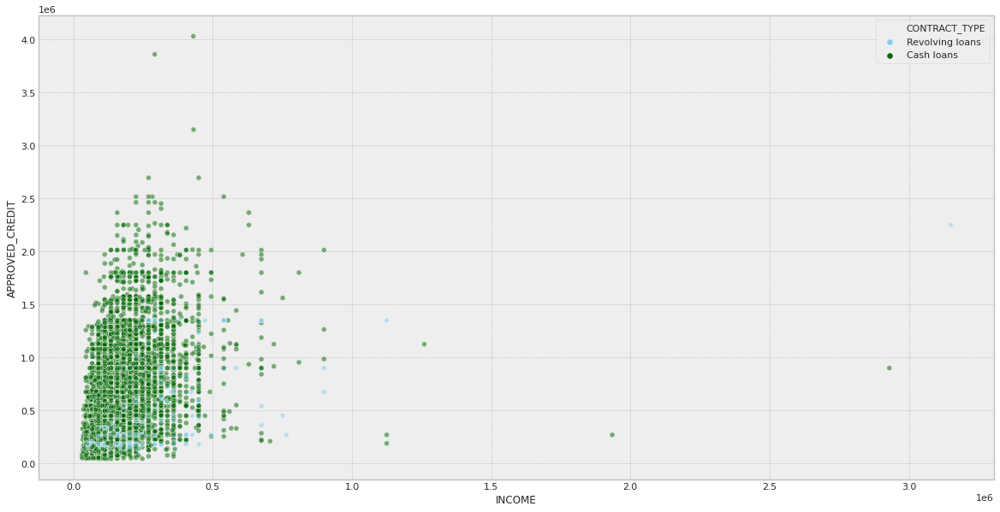

In [ ]:
fig, axes = plt.subplots(figsize = (20,10))

sns.scatterplot(x = "INCOME", y = "APPROVED_CREDIT", data = df, hue = "CONTRACT_TYPE", palette=["skyblue", "darkgreen"], alpha = 0.5)

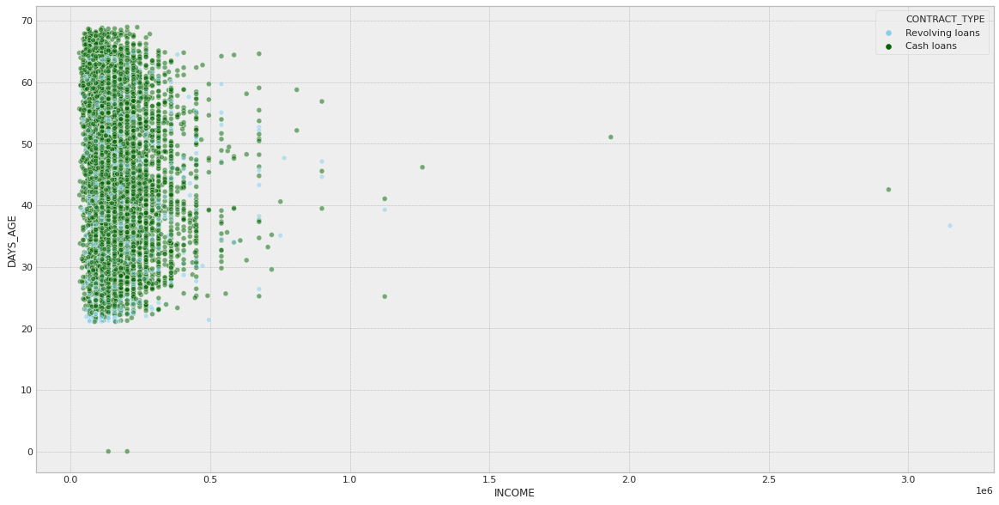

In [ ]:
fig, axes = plt.subplots(figsize = (20,10))

sns.scatterplot(x = "INCOME", y = "DAYS_AGE", data = df, hue = "CONTRACT_TYPE", palette=["skyblue", "darkgreen"], alpha = 0.5)

### Missing Values and Anomalies

```
Start from here
```



In [ ]:
data_test.shape


(14761, 24)

In [ ]:
data_train.shape



(61503, 24)

In [ ]:
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [ ]:
missing_values = missing_values_table(data_train)
missing_values1 = missing_values_table(data_test)
missing_values.head(20)


Your selected dataframe has 24 columns.
There are 5 columns that have missing values.
Your selected dataframe has 24 columns.
There are 4 columns that have missing values.


,Missing Values,% of Total Values
EXT_SCORE_1,34845,56.7
EXT_SCORE_3,12239,19.9
EXT_SCORE_2,134,0.2
PRICE,62,0.1
ANNUITY,1,0.0


In [ ]:
missing_values1.head(20)

,Missing Values,% of Total Values
EXT_SCORE_1,8312,56.3
EXT_SCORE_3,2919,19.8
PRICE,20,0.1
EXT_SCORE_2,19,0.1


In [ ]:
df = pd.concat([data_train,data_test])

In [ ]:
df.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

CONTRACT_TYPE         2
GENDER                2
INCOME_TYPE           7
EDUCATION             5
FAMILY_STATUS         5
HOUSING_TYPE          6
WEEKDAYS_APPLY        7
ORGANIZATION_TYPE    58
dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder
import os


le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in data_train:
    if data_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(data_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(data_train[col])
            # Transform both training and testing data
            data_train[col] = le.transform(data_train[col])
            data_test[col] = le.transform(data_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

2 columns were label encoded.


In [ ]:
data_train = pd.get_dummies(data_train)
data_test = pd.get_dummies(data_test)

print('Training Features shape: ', data_train.shape)
print('Testing Features shape: ', data_test.shape)

Training Features shape:  (61503, 106)
Testing Features shape:  (14761, 104)


In [ ]:
train_labels = data_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
data_train, data_test = data_train.align(data_test, join = 'inner', axis = 1)

# Add the target back in
data_train['TARGET'] = train_labels

print('Training Features shape: ', data_train.shape)
print('Testing Features shape: ', data_test.shape)

Training Features shape:  (61503, 104)
Testing Features shape:  (14761, 104)


In [ ]:
(data_train['DAYS_AGE'] / -365).describe()

count    61503.000000
mean        43.993099
std         11.954896
min         21.021918
25%         34.109589
50%         43.158904
75%         54.017808
max         69.120548
Name: DAYS_AGE, dtype: float64

In [ ]:
data_train['DAYS_WORK'].describe()

count     61503.000000
mean      64882.262768
std      142154.440320
min      -17912.000000
25%       -2761.000000
50%       -1208.000000
75%        -276.000000
max      365243.000000
Name: DAYS_WORK, dtype: float64

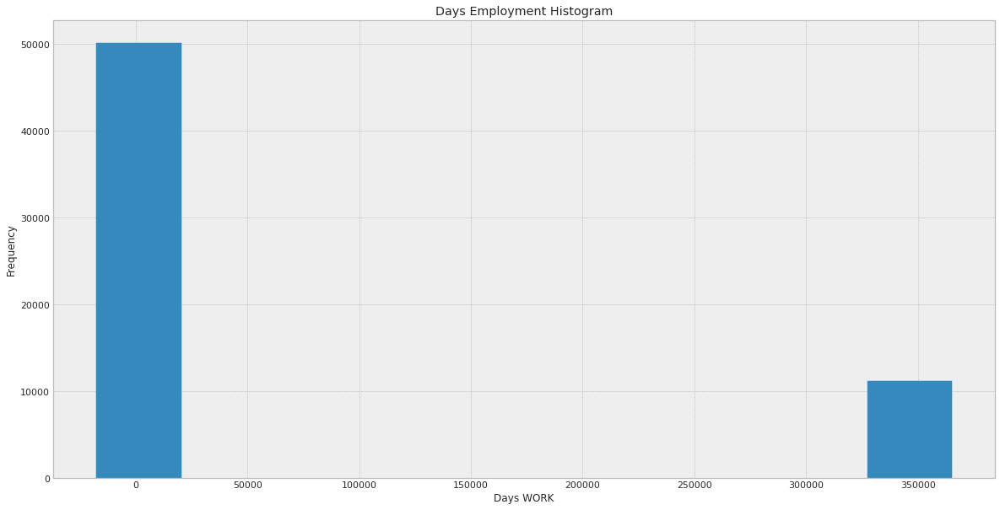

In [ ]:
data_train['DAYS_WORK'].plot.hist(title = 'Days Employment Histogram', figsize=(20,10));
plt.style.use('ggplot')
plt.xlabel('Days WORK');

In [ ]:
anom = data_train[data_train['DAYS_WORK'] == 365243]
non_anom = data_train[data_train['DAYS_WORK'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.74% of loans
The anomalies default on 5.15% of loans
There are 11253 anomalous days of employment


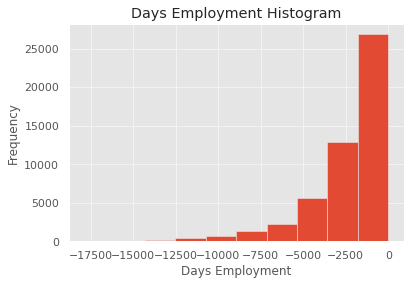

In [ ]:
data_train['DAYS_EMPLOYED_ANOM'] = data_train["DAYS_WORK"] == 365243

# Replace the anomalous values with nan
data_train['DAYS_WORK'].replace({365243: np.nan}, inplace = True)

data_train['DAYS_WORK'].plot.hist(title = 'Days Employment Histogram');
plt.style.use('ggplot')
plt.xlabel('Days Employment');

In [ ]:
data_test['DAYS_EMPLOYED_ANOM'] = data_test["DAYS_WORK"] == 365243
data_test["DAYS_WORK"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (data_test["DAYS_EMPLOYED_ANOM"].sum(), len(data_test)))

There are 2727 anomalies in the test data out of 14761 entries


In [ ]:
# Find correlations with the target and sort
correlations = data_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 ORGANIZATION_TYPE_Construction              0.021797
ORGANIZATION_TYPE_Self-employed             0.023238
ORGANIZATION_TYPE_Business Entity Type 3    0.023655
HOUSING_TYPE_With parents                   0.023800
HOUSING_TYPE_Rented apartment               0.028558
FAMILY_STATUS_Single / not married          0.029927
FAMILY_STATUS_Civil marriage                0.030607
DAYS_REGISTRATION                           0.039037
EDUCATION_Secondary / secondary special     0.054553
DAYS_ID_CHANGE                              0.055748
GENDER                                      0.059428
INCOME_TYPE_Working                         0.061628
DAYS_WORK                                   0.071475
DAYS_AGE                                    0.083524
TARGET                                      1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SCORE_3                      -0.182254
EXT_SCORE_1                      -0.175235
EXT_SCORE_2                    

Age VS Repayment

In [ ]:
# Find the correlation of the positive days since birth and target
data_train['DAYS_AGE'] = abs(data_train['DAYS_AGE'])
data_train['DAYS_AGE'].corr(data_train['TARGET'])

-0.08352387107101562

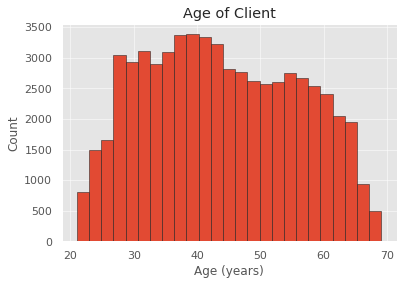

In [ ]:
plt.style.use('ggplot')

# Plot the distribution of ages in years
plt.hist(data_train['DAYS_AGE'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

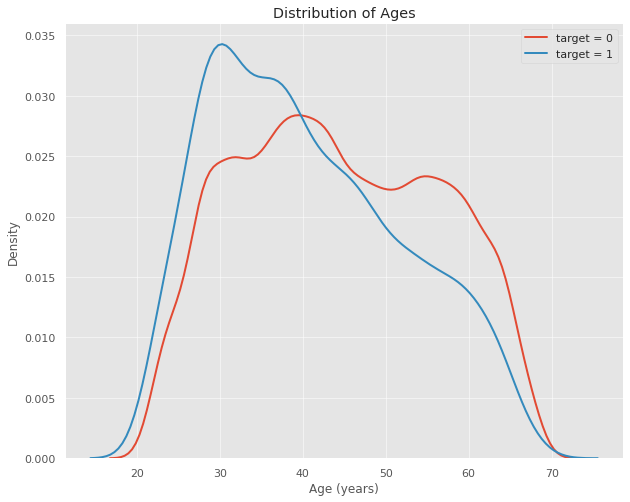

In [ ]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(data_train.loc[data_train['TARGET'] == 0, 'DAYS_AGE'] / 365, label = 'target = 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(data_train.loc[data_train['TARGET'] == 1, 'DAYS_AGE'] / 365, label = 'target = 1')

# Labeling of plot
plt.style.use('ggplot')
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

In [ ]:
# Age information into a separate dataframe
age_data = data_train[['TARGET', 'DAYS_AGE']]
age_data['YEARS_BIRTH'] = age_data['DAYS_AGE'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_AGE,YEARS_BIRTH,YEARS_BINNED
0,0,11539,31.613699,"(30.0, 35.0]"
1,0,15743,43.131507,"(40.0, 45.0]"
2,0,20775,56.917808,"(55.0, 60.0]"
3,0,20659,56.600000,"(55.0, 60.0]"
4,0,9013,24.693151,"(20.0, 25.0]"
5,0,10495,28.753425,"(25.0, 30.0]"
6,0,19417,53.197260,"(50.0, 55.0]"
7,0,16771,45.947945,"(45.0, 50.0]"
8,0,9763,26.747945,"(25.0, 30.0]"
9,0,10270,28.136986,"(25.0, 30.0]"


In [ ]:
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_AGE,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.121351,8530.737281,23.371883
"(25.0, 30.0]",0.116578,10156.427807,27.825830
"(30.0, 35.0]",0.104777,11855.240113,32.480110
"(35.0, 40.0]",0.091319,13708.160069,37.556603
"(40.0, 45.0]",0.073847,15494.986508,42.452018
"(45.0, 50.0]",0.076879,17329.706409,47.478648
"(50.0, 55.0]",0.062618,19186.446046,52.565606
"(55.0, 60.0]",0.055498,20987.287036,57.499417
"(60.0, 65.0]",0.052767,22784.580982,62.423510


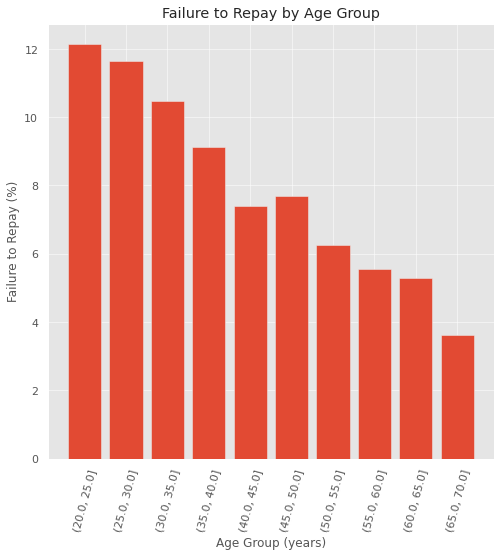

In [ ]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

EXT SCORES PROCESSING

In [ ]:
ext_data = data_train[['TARGET', 'EXT_SCORE_1', 'EXT_SCORE_2', 'EXT_SCORE_3', 'DAYS_AGE','INCOME', 'NUM_CHILDREN','DAYS_WORK']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3,DAYS_AGE,INCOME,NUM_CHILDREN,DAYS_WORK
TARGET,1.000000,-0.175235,-0.159431,-0.182254,-0.083524,-0.020814,0.018525,0.071475
EXT_SCORE_1,-0.175235,1.000000,0.217201,0.188018,0.601844,0.062803,-0.136222,-0.253674
EXT_SCORE_2,-0.159431,0.217201,1.000000,0.110022,0.089171,0.120227,-0.018246,-0.093687
EXT_SCORE_3,-0.182254,0.188018,0.110022,1.000000,0.204586,-0.063953,-0.040431,-0.129393
DAYS_AGE,-0.083524,0.601844,0.089171,0.204586,1.000000,-0.050382,-0.331271,-0.345716
INCOME,-0.020814,0.062803,0.120227,-0.063953,-0.050382,1.000000,0.021530,-0.027428
NUM_CHILDREN,0.018525,-0.136222,-0.018246,-0.040431,-0.331271,0.021530,1.000000,0.055276
DAYS_WORK,0.071475,-0.253674,-0.093687,-0.129393,-0.345716,-0.027428,0.055276,1.000000


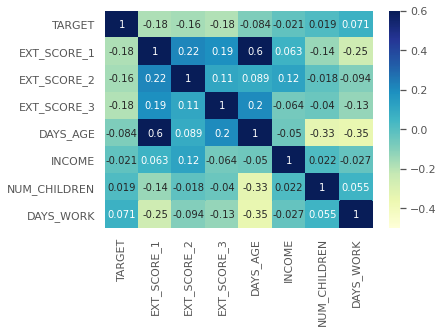

In [ ]:
sns.heatmap(ext_data_corrs, cmap = "YlGnBu", vmin = -0.5, annot = True, vmax = 0.6)

#heatmap

Feature Engineering

In [ ]:
poly_features = data_train[['EXT_SCORE_1', 'EXT_SCORE_2', 'EXT_SCORE_3', 'DAYS_AGE', 'TARGET']]
poly_features_test = data_test[['EXT_SCORE_1', 'EXT_SCORE_2', 'EXT_SCORE_3', 'DAYS_AGE']]

# imputer for handling missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = 'median')

poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)
poly_features_test = imputer.transform(poly_features_test)

from sklearn.preprocessing import PolynomialFeatures
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)

In [ ]:
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
poly_features_test = poly_transformer.transform(poly_features_test)
print('Polynomial Features shape: ', poly_features.shape)

Polynomial Features shape:  (61503, 35)


In [ ]:
poly_transformer.get_feature_names(input_features = ['EXT_SCORE_1', 'EXT_SCORE_2', 'EXT_SCORE_3', 'DAYS_AGE'])[:15]

['1',
 'EXT_SCORE_1',
 'EXT_SCORE_2',
 'EXT_SCORE_3',
 'DAYS_AGE',
 'EXT_SCORE_1^2',
 'EXT_SCORE_1 EXT_SCORE_2',
 'EXT_SCORE_1 EXT_SCORE_3',
 'EXT_SCORE_1 DAYS_AGE',
 'EXT_SCORE_2^2',
 'EXT_SCORE_2 EXT_SCORE_3',
 'EXT_SCORE_2 DAYS_AGE',
 'EXT_SCORE_3^2',
 'EXT_SCORE_3 DAYS_AGE',
 'DAYS_AGE^2']

In [ ]:
poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names(['EXT_SCORE_1', 'EXT_SCORE_2', 
                                                                           'EXT_SCORE_3', 'DAYS_AGE']))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(5))

EXT_SCORE_2 EXT_SCORE_3               -0.195651
EXT_SCORE_1 EXT_SCORE_2 EXT_SCORE_3   -0.195254
EXT_SCORE_2 EXT_SCORE_3 DAYS_AGE      -0.184426
EXT_SCORE_2^2 EXT_SCORE_3             -0.178032
EXT_SCORE_2 EXT_SCORE_3^2             -0.174632
EXT_SCORE_1 EXT_SCORE_3               -0.172598
EXT_SCORE_1 EXT_SCORE_2               -0.171310
EXT_SCORE_1 EXT_SCORE_2 DAYS_AGE      -0.161319
EXT_SCORE_1 EXT_SCORE_2^2             -0.160052
EXT_SCORE_1 EXT_SCORE_3 DAYS_AGE      -0.159699
Name: TARGET, dtype: float64
DAYS_AGE     -0.083524
DAYS_AGE^2   -0.081402
DAYS_AGE^3   -0.078467
TARGET        1.000000
1                  NaN
Name: TARGET, dtype: float64


In [ ]:
poly_features_test = pd.DataFrame(poly_features_test, 
                                  columns = poly_transformer.get_feature_names(['EXT_SCORE_1', 'EXT_SCORE_2', 
                                                                                'EXT_SCORE_3', 'DAYS_BIRTH']))

# Merge polynomial features into training dataframe
poly_features['LN_ID'] = data_train['LN_ID']
data_train_poly = data_train.merge(poly_features, on = 'LN_ID', how = 'left')

# Merge polnomial features into testing dataframe
poly_features_test['LN_ID'] = data_test['LN_ID']
data_test_poly = data_test.merge(poly_features_test, on = 'LN_ID', how = 'left')

# Align the dataframes
data_train_poly, data_test_poly = data_train_poly.align(data_test_poly, join = 'inner', axis = 1)

# Print out the new shapes
print('Training data with polynomial features shape: ', data_train_poly.shape)
print('Testing data with polynomial features shape:  ', data_test_poly.shape)

Training data with polynomial features shape:  (61503, 123)
Testing data with polynomial features shape:   (14761, 123)


Domain Features

In [ ]:
df.head(2)

,Unnamed: 0,LN_ID,TARGET,CONTRACT_TYPE,GENDER,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,INCOME_TYPE,EDUCATION,FAMILY_STATUS,HOUSING_TYPE,DAYS_AGE,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,WEEKDAYS_APPLY,HOUR_APPLY,ORGANIZATION_TYPE,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3
0,201468,333538,0,Revolving loans,F,1,67500.0,202500.0,10125.0,202500.0,Working,Secondary / secondary special,Married,With parents,-11539,-921,-119.0,-2757,TUESDAY,18,Business Entity Type 3,0.572805,0.608276,NaN
1,264803,406644,0,Cash loans,F,1,202500.0,976711.5,49869.0,873000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-15743,-4482,-1797.0,-2455,TUESDAY,14,Other,0.655600,0.684298,NaN


In [ ]:
data_train_domain = data_train.copy()
data_test_domain = data_test.copy()

data_train_domain['CREDIT_INCOME_PERCENT'] = data_train_domain['APPROVED_CREDIT'] / data_train_domain['INCOME']
data_train_domain['ANNUITY_INCOME_PERCENT'] = data_train_domain['ANNUITY'] / data_train_domain['INCOME']
data_train_domain['CREDIT_TERM'] = data_train_domain['ANNUITY'] / data_train_domain['APPROVED_CREDIT']
data_train_domain['DAYS_EMPLOYED_PERCENT'] = data_train_domain['DAYS_WORK'] / data_train_domain['DAYS_AGE']

In [ ]:
data_test_domain['CREDIT_INCOME_PERCENT'] = data_test_domain['APPROVED_CREDIT'] / data_test_domain['INCOME']
data_test_domain['ANNUITY_INCOME_PERCENT'] = data_test_domain['ANNUITY'] / data_test_domain['INCOME']
data_test_domain['CREDIT_TERM'] = data_test_domain['ANNUITY'] / data_test_domain['APPROVED_CREDIT']
data_test_domain['DAYS_EMPLOYED_PERCENT'] = data_test_domain['DAYS_WORK'] / data_test_domain['DAYS_AGE']

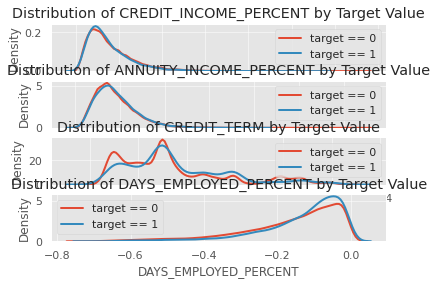

In [ ]:
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(data_train_domain.loc[data_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(data_train_domain.loc[data_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    


### Feature Engineering

In [ ]:
#LOGISTIC REG

In [ ]:
data_train.head()

,LN_ID,TARGET,CONTRACT_TYPE,GENDER,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,DAYS_AGE,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,HOUR_APPLY,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3,INCOME_TYPE_Commercial associate,INCOME_TYPE_Pensioner,INCOME_TYPE_State servant,INCOME_TYPE_Unemployed,INCOME_TYPE_Working,EDUCATION_Academic degree,EDUCATION_Higher education,EDUCATION_Incomplete higher,EDUCATION_Lower secondary,EDUCATION_Secondary / secondary special,FAMILY_STATUS_Civil marriage,FAMILY_STATUS_Married,FAMILY_STATUS_Separated,FAMILY_STATUS_Single / not married,FAMILY_STATUS_Widow,HOUSING_TYPE_Co-op apartment,HOUSING_TYPE_House / apartment,HOUSING_TYPE_Municipal apartment,HOUSING_TYPE_Office apartment,HOUSING_TYPE_Rented apartment,HOUSING_TYPE_With parents,WEEKDAYS_APPLY_FRIDAY,WEEKDAYS_APPLY_MONDAY,...,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_NA1,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,DAYS_EMPLOYED_ANOM
0,333538,0,1,0,1,67500.0,202500.0,10125.0,202500.0,11539,-921.0,-119.0,-2757,18,0.572805,0.608276,NaN,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
1,406644,0,0,0,1,202500.0,976711.5,49869.0,873000.0,15743,-4482.0,-1797.0,-2455,14,0.655600,0.684298,NaN,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
2,259130,0,0,0,0,180000.0,407520.0,25060.5,360000.0,20775,NaN,-8737.0,-4312,14,NaN,0.580687,0.749022,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,True
3,411997,0,0,1,0,225000.0,808650.0,26086.5,675000.0,20659,-10455.0,-4998.0,-4010,10,NaN,0.623740,0.710674,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
4,241559,0,1,1,0,135000.0,180000.0,9000.0,180000.0,9013,-1190.0,-3524.0,-1644,11,0.175511,0.492994,0.085595,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False


In [ ]:
data_test.drop(columns='Unnamed: 0',inplace=True)

In [ ]:
data_test.head()

,LN_ID,TARGET,CONTRACT_TYPE,GENDER,NUM_CHILDREN,INCOME,APPROVED_CREDIT,ANNUITY,PRICE,DAYS_AGE,DAYS_WORK,DAYS_REGISTRATION,DAYS_ID_CHANGE,HOUR_APPLY,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3,INCOME_TYPE_Commercial associate,INCOME_TYPE_Pensioner,INCOME_TYPE_State servant,INCOME_TYPE_Unemployed,INCOME_TYPE_Working,EDUCATION_Academic degree,EDUCATION_Higher education,EDUCATION_Incomplete higher,EDUCATION_Lower secondary,EDUCATION_Secondary / secondary special,FAMILY_STATUS_Civil marriage,FAMILY_STATUS_Married,FAMILY_STATUS_Separated,FAMILY_STATUS_Single / not married,FAMILY_STATUS_Widow,HOUSING_TYPE_Co-op apartment,HOUSING_TYPE_House / apartment,HOUSING_TYPE_Municipal apartment,HOUSING_TYPE_Office apartment,HOUSING_TYPE_Rented apartment,HOUSING_TYPE_With parents,WEEKDAYS_APPLY_FRIDAY,WEEKDAYS_APPLY_MONDAY,...,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_NA1,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,DAYS_EMPLOYED_ANOM
0,219092,0,0,1,3,135000.0,871029.0,44604.0,765000.0,-17598,-2650.0,-1411.0,-1131,7,NaN,0.145475,0.651260,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
1,141577,0,0,0,0,144000.0,485640.0,34537.5,450000.0,-14097,-7408.0,-7908.0,-4872,14,NaN,0.682675,NaN,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
2,180205,0,0,0,1,90000.0,247500.0,8887.5,247500.0,-18384,-2826.0,-8226.0,-1930,12,0.814700,0.686312,0.758393,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
3,357381,0,0,1,2,112500.0,506889.0,24781.5,418500.0,-12170,-926.0,-916.0,-4048,13,0.399219,0.266520,0.058826,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False
4,271229,0,0,1,0,216000.0,450000.0,21888.0,450000.0,-10790,-577.0,-4640.0,-2035,14,0.368452,0.610483,0.392774,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,False


In [ ]:
from sklearn.preprocessing import MinMaxScaler
# Drop the target from the training data

if 'TARGET' in data_train:
    train = data_train.drop(columns = ['TARGET'])
else:
    train = data_train.copy()
    
#Feature names
features = list(train.columns)

# Copy of the testing data
test = data_test.copy()

# Median imputation of missing values
imputer = SimpleImputer(strategy = 'median')

# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range = (0, 1))

# Fit on the training data
imputer.fit(train)

# Transform both training and testing data
train = imputer.transform(train)
test = imputer.transform(data_test)

# Repeat with the scaler
scaler.fit(train)
train = scaler.transform(train)
test = scaler.transform(test)

print('Training data shape: ', train.shape)
print('Testing data shape: ', test.shape)

Training data shape:  (61503, 104)
Testing data shape:  (14761, 104)


In [ ]:
from sklearn.linear_model import LogisticRegression

# Make the model with the specified regularization parameter
log_reg = LogisticRegression(C = 0.0001)

# Train on the training data
log_reg.fit(train, train_labels)

LogisticRegression(C=0.0001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
# Make predictions
# Make sure to select the second column only
log_reg_pred = log_reg.predict_proba(test)[:, 1]

In [ ]:
# Submission dataframe
submit = data_test[['LN_ID']]
submit['TARGET'] = log_reg_pred

submit.head()


,LN_ID,TARGET
0,219092,0.093254
1,141577,0.079388
2,180205,0.085293
3,357381,0.093278
4,271229,0.087698


In [ ]:
# Save the submission to a csv file
submit.to_csv('log_reg_baseline.csv', index = False)

Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Make the random forest classifier
random_forest = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

In [ ]:
# Train on the training data
random_forest.fit(train, train_labels)

# Extract feature importances
feature_importance_values = random_forest.feature_importances_
feature_importances = pd.DataFrame({'feature': features, 'importance': feature_importance_values})

# Make predictions on the test data
predictions = random_forest.predict_proba(test)[:, 1]

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   15.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.3s finished


In [ ]:
# Make a submission dataframe
submit = data_test[['LN_ID']]
submit['TARGET'] = predictions

# Save the submission dataframe
submit.to_csv('random_forest_baseline.csv', index = False)

POLY_features

In [ ]:

# Impute the polynomial features
imputer = SimpleImputer(strategy = 'median')

poly_features = imputer.fit_transform(data_train_poly)
poly_features_test = imputer.transform(data_test_poly)

# Scale the polynomial features
scaler = MinMaxScaler(feature_range = (0, 1))

poly_features = scaler.fit_transform(poly_features)
poly_features_test = scaler.transform(poly_features_test)

random_forest_poly = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

In [ ]:
# Train on the training data
random_forest_poly.fit(poly_features, train_labels)

# Make predictions on the test data
predictions = random_forest_poly.predict_proba(poly_features_test)[:, 1]

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   23.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.4s finished


In [ ]:
submit = data_test[['LN_ID']]
submit['TARGET'] = predictions

# Save the submission dataframe
submit.to_csv('random_forest_baseline_engineered.csv', index = False)

Domain Features

GGWP
```



In [ ]:

domain_features_names = list(data_train_domain.columns)

# Impute the domainnomial features
imputer = SimpleImputer(strategy = 'median')

domain_features = imputer.fit_transform(data_train_domain)
domain_features_test = imputer.transform(data_test_domain)

# Scale the domainnomial features
scaler = MinMaxScaler(feature_range = (0, 1))

domain_features = scaler.fit_transform(domain_features)
domain_features_test = scaler.transform(domain_features_test)

random_forest_domain = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

# Train on the training data
random_forest_domain.fit(domain_features, train_labels)

# Extract feature importances
feature_importance_values_domain = random_forest_domain.feature_importances_
feature_importances_domain = pd.DataFrame({'feature': domain_features_names, 'importance': feature_importance_values_domain})

# Make predictions on the test data
predictions = random_forest_domain.predict_proba(domain_features_test)[:, 1]

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.2s finished


In [ ]:
submit = data_test[['LN_ID']]
submit['TARGET'] = predictions

# Save the submission dataframe
submit.to_csv('random_forest_baseline_domain.csv', index = False)

Interpretation

In [ ]:
def plot_feature_importances(df):
    """
    Plot importances returned by a model. This can work with any measure of
    feature importance provided that higher importance is better. 
    
    Args:
        df (dataframe): feature importances. Must have the features in a column
        called `features` and the importances in a column called `importance
        
    Returns:
        shows a plot of the 15 most importance features
        
        df (dataframe): feature importances sorted by importance (highest to lowest) 
        with a column for normalized importance
        """
    
    # Sort features according to importance
    df = df.sort_values('importance', ascending = False).reset_index()
    
    # Normalize the feature importances to add up to one
    df['importance_normalized'] = df['importance'] / df['importance'].sum()

    # Make a horizontal bar chart of feature importances
    plt.figure(figsize = (10, 6))
    ax = plt.subplot()
    
    # Need to reverse the index to plot most important on top
    ax.barh(list(reversed(list(df.index[:15]))), 
            df['importance_normalized'].head(15), 
            align = 'center', edgecolor = 'k')
    
    # Set the yticks and labels
    ax.set_yticks(list(reversed(list(df.index[:15]))))
    ax.set_yticklabels(df['feature'].head(15))
    
    # Plot labeling
    plt.xlabel('Normalized Importance'); plt.title('Feature Importances')
    plt.show()
    
    return df

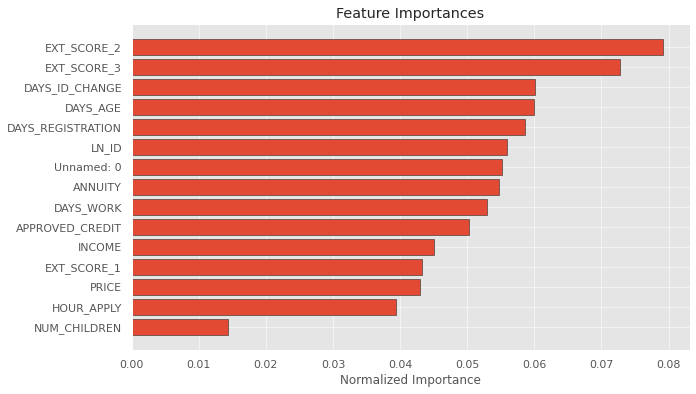

In [ ]:
feature_importances_sorted = plot_feature_importances(feature_importances)

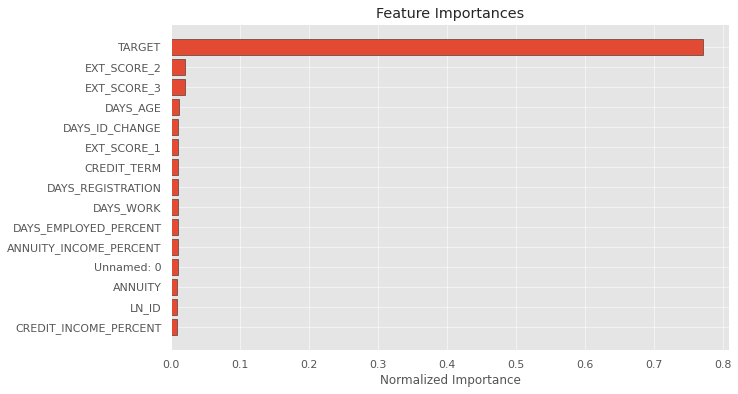

In [ ]:
feature_importances_domain_sorted = plot_feature_importances(feature_importances_domain)

In [ ]:
feature_importances_domain_sorted.drop([0], inplace=True)

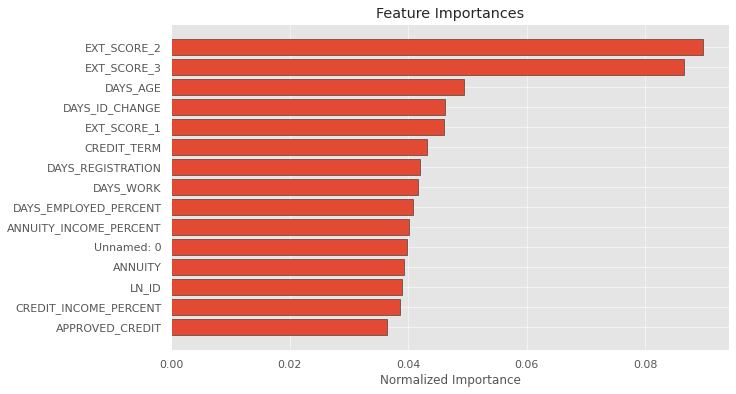

,level_0,index,feature,importance,importance_normalized
0,1,16,EXT_SCORE_2,0.020574,0.089729
1,2,17,EXT_SCORE_3,0.019865,0.086633
2,3,10,DAYS_AGE,0.011353,0.049513
3,4,13,DAYS_ID_CHANGE,0.010583,0.046156
4,5,15,EXT_SCORE_1,0.010567,0.046084
...,...,...,...,...,...
103,104,23,EDUCATION_Academic degree,0.000019,0.000082
104,105,63,ORGANIZATION_TYPE_Industry: type 12,0.000014,0.000062
105,106,64,ORGANIZATION_TYPE_Industry: type 13,0.000011,0.000050
106,107,21,INCOME_TYPE_Unemployed,0.000009,0.000041


In [ ]:
plot_feature_importances(feature_importances_domain_sorted)

## Feature Engineering with LGBM

LGBM

In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
import lightgbm as lgb
import gc

def model(features, test_features, encoding = 'ohe', n_folds = 5):
    
    """Train and test a light gradient boosting model using
    cross validation. 
    
    Parameters
    --------
        features (pd.DataFrame): 
            dataframe of training features to use 
            for training a model. Must include the TARGET column.
        test_features (pd.DataFrame): 
            dataframe of testing features to use
            for making predictions with the model. 
        encoding (str, default = 'ohe'): 
            method for encoding categorical variables. Either 'ohe' for one-hot encoding or 'le' for integer label encoding
            n_folds (int, default = 5): number of folds to use for cross validation
        
    Return
    --------
        submission (pd.DataFrame): 
            dataframe with `LN_ID` and `TARGET` probabilities
            predicted by the model.
        feature_importances (pd.DataFrame): 
            dataframe with the feature importances from the model.
        valid_metrics (pd.DataFrame): 
            dataframe with training and validation metrics (ROC AUC) for each fold and overall.
        
    """
    
    # Extract the ids
    train_ids = features['LN_ID']
    test_ids = test_features['LN_ID']
    
    # Extract the labels for training
    labels = features['TARGET']
    
    # Remove the ids and target
    features = features.drop(columns = ['LN_ID', 'TARGET'])
    test_features = test_features.drop(columns = ['LN_ID'])
    
    
    # One Hot Encoding
    if encoding == 'ohe':
        features = pd.get_dummies(features)
        test_features = pd.get_dummies(test_features)
        
        # Align the dataframes by the columns
        features, test_features = features.align(test_features, join = 'inner', axis = 1)
        
        # No categorical indices to record
        cat_indices = 'auto'
    
    # Integer label encoding
    elif encoding == 'le':
        
        # Create a label encoder
        label_encoder = LabelEncoder()
        
        # List for storing categorical indices
        cat_indices = []
        
        # Iterate through each column
        for i, col in enumerate(features):
            if features[col].dtype == 'object':
                # Map the categorical features to integers
                features[col] = label_encoder.fit_transform(np.array(features[col].astype(str)).reshape((-1,)))
                test_features[col] = label_encoder.transform(np.array(test_features[col].astype(str)).reshape((-1,)))

                # Record the categorical indices
                cat_indices.append(i)
    
    # Catch error if label encoding scheme is not valid
    else:
        raise ValueError("Encoding must be either 'ohe' or 'le'")
        
    print('Training Data Shape: ', features.shape)
    print('Testing Data Shape: ', test_features.shape)
    
    # Extract feature names
    feature_names = list(features.columns)
    
    # Convert to np arrays
    features = np.array(features)
    test_features = np.array(test_features)
    
    # Create the kfold object
    k_fold = KFold(n_splits = n_folds, shuffle = True, random_state = 50)
    
    # Empty array for feature importances
    feature_importance_values = np.zeros(len(feature_names))
    
    # Empty array for test predictions
    test_predictions = np.zeros(test_features.shape[0])
    
    # Empty array for out of fold validation predictions
    out_of_fold = np.zeros(features.shape[0])
    
    # Lists for recording validation and training scores
    valid_scores = []
    train_scores = []
    
    # Iterate through each fold
    for train_indices, valid_indices in k_fold.split(features):
        
        # Training data for the fold
        train_features, train_labels = features[train_indices], labels[train_indices]
        # Validation data for the fold
        valid_features, valid_labels = features[valid_indices], labels[valid_indices]
        
        # Create the model
        model = lgb.LGBMClassifier(n_estimators=10000, objective = 'binary', 
                                   class_weight = 'balanced', learning_rate = 0.05, 
                                   reg_alpha = 0.1, reg_lambda = 0.1, 
                                   subsample = 0.8, n_jobs = -1, random_state = 50)
        
        # Train the model
        model.fit(train_features, train_labels, eval_metric = 'auc',
                  eval_set = [(valid_features, valid_labels), (train_features, train_labels)],
                  eval_names = ['valid', 'train'], categorical_feature = cat_indices,
                  early_stopping_rounds = 100, verbose = 200)
        
        # Record the best iteration
        best_iteration = model.best_iteration_
        
        # Record the feature importances
        feature_importance_values += model.feature_importances_ / k_fold.n_splits
        
        # Make predictions
        test_predictions += model.predict_proba(test_features, num_iteration = best_iteration)[:, 1] / k_fold.n_splits
        
        # Record the out of fold predictions
        out_of_fold[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]
        
        # Record the best score
        valid_score = model.best_score_['valid']['auc']
        train_score = model.best_score_['train']['auc']
        
        valid_scores.append(valid_score)
        train_scores.append(train_score)
        
        # Clean up memory
        gc.enable()
        del model, train_features, valid_features
        gc.collect()
        
    # Make the submission dataframe
    submission = pd.DataFrame({'LN_ID': test_ids, 'TARGET': test_predictions})
    
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})
    
    # Overall validation score
    valid_auc = roc_auc_score(labels, out_of_fold)
    
    # Add the overall scores to the metrics
    valid_scores.append(valid_auc)
    train_scores.append(np.mean(train_scores))
    
    # Needed for creating dataframe of validation scores
    fold_names = list(range(n_folds))
    fold_names.append('overall')
    
    # Dataframe of validation scores
    metrics = pd.DataFrame({'fold': fold_names,
                            'train': train_scores,
                            'valid': valid_scores}) 
    
    return submission, feature_importances, metrics

In [ ]:
submission, fi, metrics = model(data_train, data_test)
print('Baseline metrics')
print(metrics)

Training Data Shape:  (61503, 102)
Testing Data Shape:  (14761, 102)
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[93]	train's binary_logloss: 0.527796	train's auc: 0.824727	valid's binary_logloss: 0.54669	valid's auc: 0.755911
Training until validation scores don't improve for 100 rounds.
[200]	train's binary_logloss: 0.472755	train's auc: 0.872656	valid's binary_logloss: 0.523032	valid's auc: 0.733234
Early stopping, best iteration is:
[116]	train's binary_logloss: 0.510987	train's auc: 0.838627	valid's binary_logloss: 0.545925	valid's auc: 0.736562
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[91]	train's binary_logloss: 0.530778	train's auc: 0.822223	valid's binary_logloss: 0.550717	valid's auc: 0.765505
Training until validation scores don't improve for 100 rounds.
[200]	train's binary_logloss: 0.475194	train's auc: 0.87162	valid's binary_logloss: 0.530883	valid's auc: 0.74698

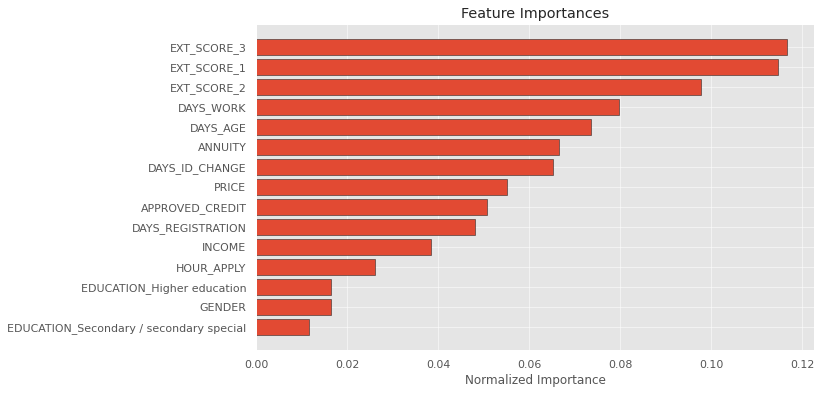

In [ ]:
fi_sorted = plot_feature_importances(fi)

In [ ]:
submission.to_csv('baseline_lgb.csv', index = False)

In [ ]:
data_train_domain['TARGET'] = train_labels

# Test the domain knolwedge features
submission_domain, fi_domain, metrics_domain = model(data_train_domain, data_test_domain)
print('Baseline with domain knowledge features metrics')
print(metrics_domain)

Training Data Shape:  (61503, 107)
Testing Data Shape:  (14761, 107)
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[83]	train's binary_logloss: 0.528169	train's auc: 0.824965	valid's binary_logloss: 0.546208	valid's auc: 0.760578
Training until validation scores don't improve for 100 rounds.
[200]	train's binary_logloss: 0.460367	train's auc: 0.883201	valid's binary_logloss: 0.512511	valid's auc: 0.742057
Early stopping, best iteration is:
[118]	train's binary_logloss: 0.500677	train's auc: 0.848395	valid's binary_logloss: 0.536948	valid's auc: 0.744438
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[99]	train's binary_logloss: 0.518561	train's auc: 0.834324	valid's binary_logloss: 0.543034	valid's auc: 0.766755
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[99]	train's binary_logloss: 0.514353	train's auc: 0.836755	valid's binary_lo

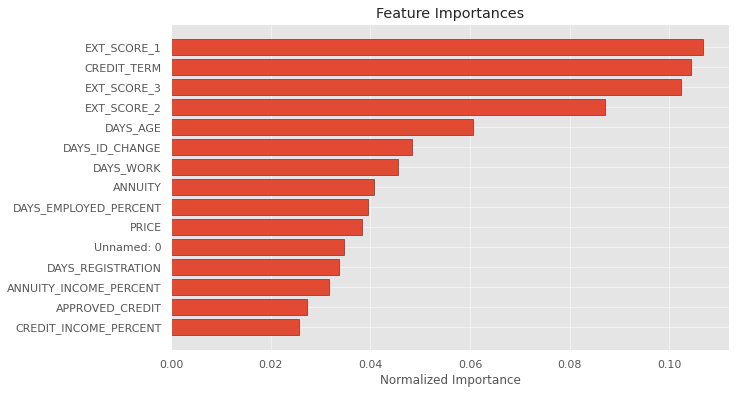

In [ ]:
fi_sorted = plot_feature_importances(fi_domain)

In [ ]:
submission_domain.to_csv('baseline_lgb_domain_features.csv', index = False)

## LOGRES, KNN, SVC with conf Matrix

In [ ]:
df.drop(columns=["INCOME_TYPE","Unnamed: 0", "LN_ID", "CONTRACT_TYPE", "GENDER", "NUM_CHILDREN", "INCOME", "APPROVED_CREDIT", "PRICE", "EDUCATION", "FAMILY_STATUS", "HOUSING_TYPE","DAYS_REGISTRATION","WEEKDAYS_APPLY","HOUR_APPLY","ORGANIZATION_TYPE"], inplace=True)

In [ ]:
df.head()

,TARGET,ANNUITY,DAYS_AGE,DAYS_WORK,DAYS_ID_CHANGE,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3
0,0,10125.0,-11539,-921,-2757,0.572805,0.608276,NaN
1,0,49869.0,-15743,-4482,-2455,0.655600,0.684298,NaN
2,0,25060.5,-20775,365243,-4312,NaN,0.580687,0.749022
3,0,26086.5,-20659,-10455,-4010,NaN,0.623740,0.710674
4,0,9000.0,-9013,-1190,-1644,0.175511,0.492994,0.085595


In [ ]:
df.shape

(76264, 8)

In [ ]:
df = df.fillna(df.median())

In [ ]:
missing_values2 = missing_values_table(df)

Your selected dataframe has 8 columns.
There are 0 columns that have missing values.


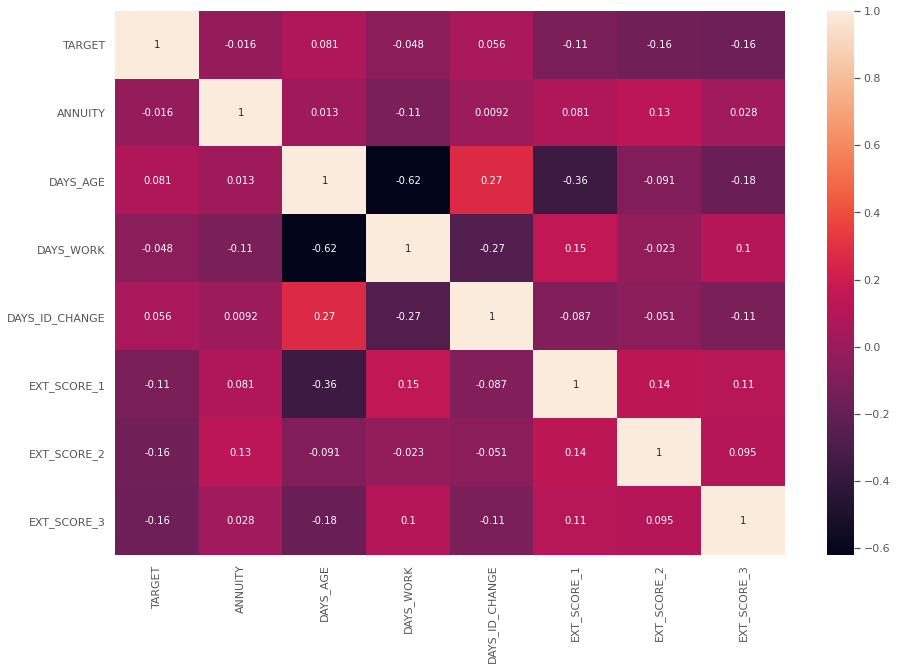

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, fmt='.2g');

In [ ]:
# data_train = df.drop(columns=["id", "zip_code"])   # Drop id and zip_code since we won't be able to use them to build our model.
target_col = ["TARGET"]                    
col_names = list(df.columns)
col_names.remove(target_col[0])

df = df[col_names + target_col]      # Send the target column to the end of the dataframe.

In [ ]:
std = StandardScaler()

col_names = list(df.columns)
col_names.remove("TARGET")

scaled = std.fit_transform(df[col_names])     # Standardize the columns to get them on the same scale
scaled = pd.DataFrame(scaled, columns=col_names)

# df = pd.concat([scaled, df[target_col]], axis=1)

df.head()

,ANNUITY,DAYS_AGE,DAYS_WORK,DAYS_ID_CHANGE,EXT_SCORE_1,EXT_SCORE_2,EXT_SCORE_3,TARGET
0,10125.0,-11539,-921,-2757,0.572805,0.608276,0.535276,0
1,49869.0,-15743,-4482,-2455,0.655600,0.684298,0.535276,0
2,25060.5,-20775,365243,-4312,0.509140,0.580687,0.749022,0
3,26086.5,-20659,-10455,-4010,0.509140,0.623740,0.710674,0
4,9000.0,-9013,-1190,-1644,0.175511,0.492994,0.085595,0


In [ ]:
X = df[col_names]      # Contains the independent columns 
y = df[target_col]     # Our target column

In [ ]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.1, random_state = 42)
train_y = train_y["TARGET"]
test_y = test_y["TARGET"]

In [ ]:
conf_matrix_all = {}

def personal_loan_prediction(name, algo, training_x, testing_x, training_y, testing_y, plot) :
    algo.fit(training_x,training_y)                           # Fit the training data set to the algorithm passed.
    predictions = algo.predict(testing_x)                     # Get all predictions
    probabilities = algo.predict_proba(testing_x)             # Get probablities of predictions

    conf_matrix = confusion_matrix(testing_y, predictions)    # Get confusion matrix using the predictions
    tn, fp, fn, tp = conf_matrix.ravel()
    
    conf_matrix_all[name] = conf_matrix                       # Save confusion matrix values to a dictionary
    
    print("Classification report:")                           # Print the classification report
    print(classification_report(testing_y, predictions))
  
    model_roc_auc = roc_auc_score(testing_y, predictions)           # Get the Area under the curve number
    fpr,tpr,thresholds = roc_curve(testing_y, probabilities[:,1])   # Get False postive rate and true positive rate
    
    print ("Area under the curve: ", model_roc_auc)
    
    
    if plot:
        fig, axes = plt.subplots(1,2, figsize=(20, 7))
        conf_matrix = np.flip(conf_matrix)
        
        labels = np.array([['\nTP','\nFN'],['\nFP','\nTN']])
        labels = np.core.defchararray.add(conf_matrix.astype(str), labels)
        sns.heatmap(conf_matrix, fmt='', annot = labels, ax=axes[0], cmap="YlGnBu", xticklabels=[1, 0], yticklabels=[1, 0]);                                           # Plot the confusion matrix
        axes[0].set(xlabel='Predicted', ylabel='Actual')

        plt.title('Receiver Operating Characteristic')
        sns.lineplot(fpr, tpr, ax=axes[1])                                         # Plot the ROC curve
        plt.plot([0, 1], [0, 1],'--')                                              # Plot the diagonal line
        axes[1].set_xlim([0, 1])                                                   # Set x-axis limit to 0 and 1
        axes[1].set_ylim([0, 1])                                                   # Set y-axis limit to 0 and 1
        axes[1].set(xlabel = 'False Positive Rate', ylabel = 'True Positive Rate');
        plt.show();

Classification report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      7023
           1       0.71      0.01      0.02       604

    accuracy                           0.92      7627
   macro avg       0.82      0.50      0.49      7627
weighted avg       0.90      0.92      0.88      7627

Area under the curve:  0.5039966835553569


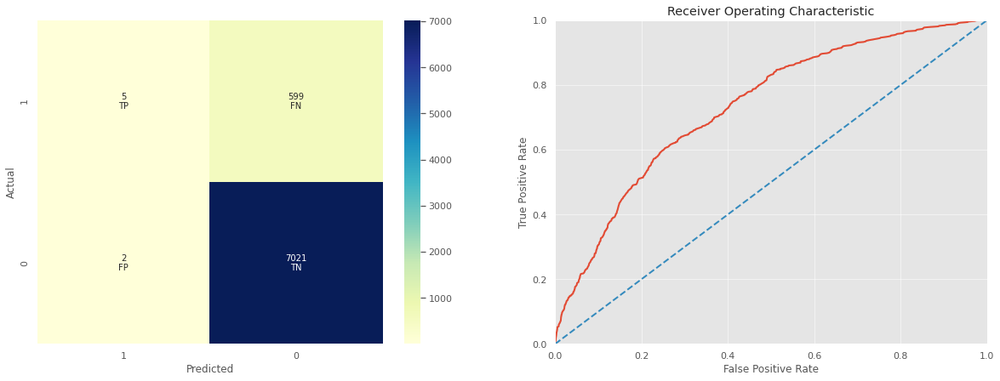

In [ ]:
lr  = LogisticRegression(C=0.4, class_weight=None, dual=False, fit_intercept=True, intercept_scaling=1, penalty="l1", solver='liblinear')

personal_loan_prediction("Logistic Regression", lr, train_X, test_X, train_y, test_y, plot = True)

Classification report:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92      7023
           1       0.09      0.09      0.09       604

    accuracy                           0.85      7627
   macro avg       0.51      0.51      0.51      7627
weighted avg       0.86      0.85      0.86      7627

Area under the curve:  0.5055896048272799


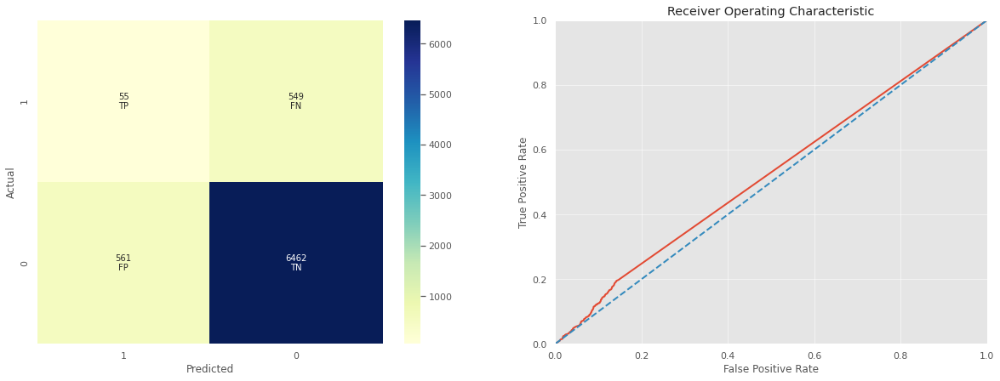

In [ ]:
knn = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan', metric_params=None, n_neighbors = 2, weights='distance')

personal_loan_prediction("K-Nearest Neighbours", knn, train_X, test_X, train_y, test_y, plot=True)

Classification report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      7023
           1       0.00      0.00      0.00       604

    accuracy                           0.92      7627
   macro avg       0.46      0.50      0.48      7627
weighted avg       0.85      0.92      0.88      7627

Area under the curve:  0.5


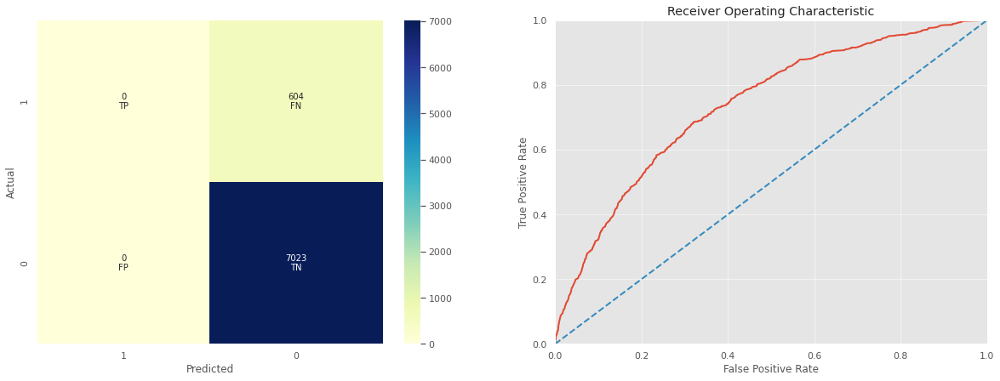

In [ ]:
rfc = RandomForestClassifier(n_estimators = 100, max_depth = 5, criterion = "entropy", 
                               min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                               max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                               bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, 
                               warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)

personal_loan_prediction("Random Forest", rfc,train_X,test_X,train_y,test_y, plot=True) 

Classification report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      7023
           1       0.39      0.02      0.03       604

    accuracy                           0.92      7627
   macro avg       0.66      0.51      0.50      7627
weighted avg       0.88      0.92      0.89      7627

Area under the curve:  0.5078956512801364


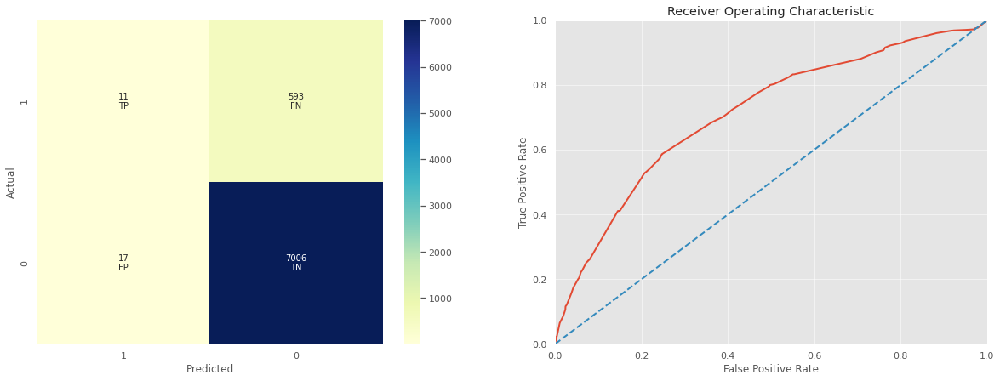

In [ ]:
dtc = DecisionTreeClassifier(criterion='entropy', splitter='best', max_depth=7, min_samples_split=2, 
                             min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, 
                             random_state=None, max_leaf_nodes=None, min_impurity_decrease=0, 
                             min_impurity_split=None, class_weight=None, presort='deprecated', ccp_alpha=0.0)

personal_loan_prediction("Decision Tree", dtc, train_X, test_X, train_y, test_y, plot=True)

In [ ]:
svc = SVC(C=1.0, kernel='rbf', degree= 2, gamma=1.0, random_state=None,
          coef0=0.0, shrinking=True, probability=True,tol=0.001,
          cache_size=200, class_weight=None, verbose=False,max_iter= -1)

personal_loan_prediction("Support Vector Classifier", svc, train_X, test_X, train_y, test_y, plot=True)

Classification report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      7023
           1       1.00      0.00      0.01       604

    accuracy                           0.92      7627
   macro avg       0.96      0.50      0.48      7627
weighted avg       0.93      0.92      0.88      7627

Area under the curve:  0.5024834437086093


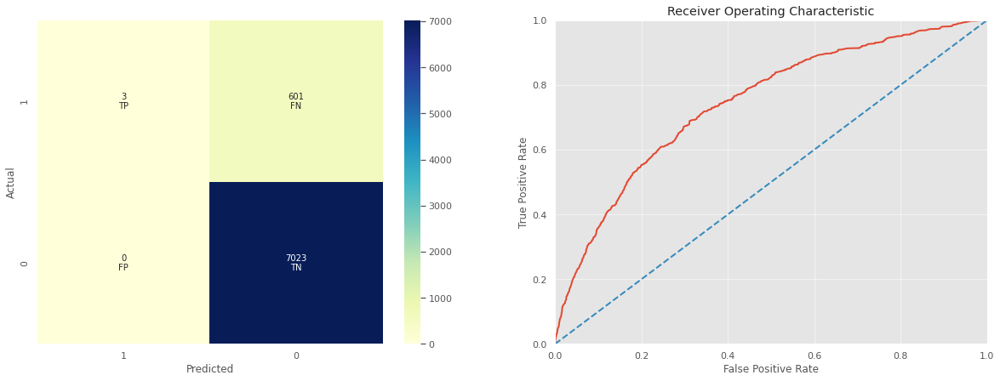

In [ ]:
from xgboost import XGBClassifier

xgc = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                        colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
                        max_depth = 3, min_child_weight=1, missing=None, n_estimators=100,
                        objective='binary:logistic', random_state=0, reg_alpha=0, reg_lambda=1, 
                        scale_pos_weight=1, subsample=1)

personal_loan_prediction("XGBoost", xgc, train_X, test_X, train_y, test_y, plot=True)

# BAGIAN 2
Bagian Dimasukkan data previous dan installment

In [4]:
plt.style.use('fivethirtyeight')

# Memory management
import gc 

Grouping Numeric

In [5]:
def agg_numeric(df, parent_var, df_name):
    """
    Groups and aggregates the numeric values in a child dataframe
    by the parent variable.
    
    Parameters
    --------
        df (dataframe): 
            the child dataframe to calculate the statistics on
        parent_var (string): 
            the parent variable used for grouping and aggregating
        df_name (string): 
            the variable used to rename the columns
        
    Return
    --------
        agg (dataframe): 
            a dataframe with the statistics aggregated by the `parent_var` for 
            all numeric columns. Each observation of the parent variable will have 
            one row in the dataframe with the parent variable as the index. 
            The columns are also renamed using the `df_name`. Columns with all duplicate
            values are removed. 
    
    """
    
    # Remove id variables other than grouping variable
    for col in df:
        if col != parent_var and 'LN_ID' in col:
            df = df.drop(columns = col)
            
    # Only want the numeric variables
    parent_ids = df[parent_var].copy()
    numeric_df = df.select_dtypes('number').copy()
    numeric_df[parent_var] = parent_ids

    # Group by the specified variable and calculate the statistics
    agg = numeric_df.groupby(parent_var).agg(['count', 'mean', 'max', 'min', 'sum'])

    # Need to create new column names
    columns = []

    # Iterate through the variables names
    for var in agg.columns.levels[0]:
        if var != parent_var:
            # Iterate through the stat names
            for stat in agg.columns.levels[1]:
                # Make a new column name for the variable and stat
                columns.append('%s_%s_%s' % (df_name, var, stat))
    
    agg.columns = columns
    
    # Remove the columns with all redundant values
    _, idx = np.unique(agg, axis = 1, return_index=True)
    agg = agg.iloc[:, idx]
    
    return agg

Grouping Categorical

In [6]:
def agg_categorical(df, parent_var, df_name):
    """
    Aggregates the categorical features in a child dataframe
    for each observation of the parent variable.
    
    Parameters
    --------
    df : dataframe 
        The dataframe to calculate the value counts for.
        
    parent_var : string
        The variable by which to group and aggregate the dataframe. For each unique
        value of this variable, the final dataframe will have one row
        
    df_name : string
        Variable added to the front of column names to keep track of columns

    
    Return
    --------
    categorical : dataframe
        A dataframe with aggregated statistics for each observation of the parent_var
        The columns are also renamed and columns with duplicate values are removed.
        
    """
    
    # Select the categorical columns
    categorical = pd.get_dummies(df.select_dtypes('category'))

    # Make sure to put the identifying id on the column
    categorical[parent_var] = df[parent_var]

    # Groupby the group var and calculate the sum and mean
    categorical = categorical.groupby(parent_var).agg(['sum', 'count', 'mean'])
    
    column_names = []
    
    # Iterate through the columns in level 0
    for var in categorical.columns.levels[0]:
        # Iterate through the stats in level 1
        for stat in ['sum', 'count', 'mean']:
            # Make a new column name
            column_names.append('%s_%s_%s' % (df_name, var, stat))
    
    categorical.columns = column_names
    
    # Remove duplicate columns by values
    _, idx = np.unique(categorical, axis = 1, return_index = True)
    categorical = categorical.iloc[:, idx]
    
    return categorical

Target Grouping

In [7]:
# Plots the disribution of a variable colored by value of the target
def kde_target(var_name, df):
    
    # Calculate the correlation coefficient between the new variable and the target
    corr = df['TARGET'].corr(df[var_name])
    
    # Calculate medians for repaid vs not repaid
    avg_repaid = df.ix[df['TARGET'] == 0, var_name].median()
    avg_not_repaid = df.ix[df['TARGET'] == 1, var_name].median()
    
    plt.figure(figsize = (12, 6))
    
    # Plot the distribution for target == 0 and target == 1
    sns.kdeplot(df.ix[df['TARGET'] == 0, var_name], label = 'TARGET == 0')
    sns.kdeplot(df.ix[df['TARGET'] == 1, var_name], label = 'TARGET == 1')
    
    # label the plot
    plt.xlabel(var_name); plt.ylabel('Density'); plt.title('%s Distribution' % var_name)
    plt.legend();
    
    # print out the correlation
    print('The correlation between %s and the TARGET is %0.4f' % (var_name, corr))
    # Print out average values
    print('Median value for loan that was not repaid = %0.4f' % avg_not_repaid)
    print('Median value for loan that was repaid =     %0.4f' % avg_repaid)
    

Function

In [8]:
import sys

def return_size(df):
    """Return size of dataframe in gigabytes"""
    return round(sys.getsizeof(df) / 1e9, 2)

def convert_types(df, print_info = False):
    
    original_memory = df.memory_usage().sum()
    
    # Iterate through each column
    for c in df:
        
        # Convert ids and booleans to integers
        if ('LN_ID' in c):
            df[c] = df[c].fillna(0).astype(np.int32)
            
        # Convert objects to category
        elif (df[c].dtype == 'object') and (df[c].nunique() < df.shape[0]):
            df[c] = df[c].astype('category')
        
        # Booleans mapped to integers
        elif list(df[c].unique()) == [1, 0]:
            df[c] = df[c].astype(bool)
        
        # Float64 to float32
        elif df[c].dtype == float:
            df[c] = df[c].astype(np.float32)
            
        # Int64 to int32
        elif df[c].dtype == int:
            df[c] = df[c].astype(np.int32)
        
    new_memory = df.memory_usage().sum()
    
    if print_info:
        print(f'Original Memory Usage: {round(original_memory / 1e9, 2)} gb.')
        print(f'New Memory Usage: {round(new_memory / 1e9, 2)} gb.')
        
    return df

In [9]:
data_previous1 = convert_types(data_previous, print_info=True)
data_previous1.head()

Original Memory Usage: 0.05 gb.
New Memory Usage: 0.02 gb.


,Unnamed: 0,SK_ID_PREV,LN_ID,CONTRACT_TYPE,ANNUITY,APPLICATION,APPROVED_CREDIT,AMT_DOWN_PAYMENT,PRICE,WEEKDAYS_APPLY,HOUR_APPLY,CONTRACT_STATUS,DAYS_DECISION,TERM_PAYMENT,YIELD_GROUP,FIRST_DRAW,FIRST_DUE,TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,0,2030495,271877,Consumer loans,1730.430054,17145.0,17145.0,0.0,17145.0,SATURDAY,15.0,Approved,-73.0,12.0,middle,365243.0,-42.0,-37.0,0.0
1,3,2819243,176158,Cash loans,47041.335938,450000.0,470790.0,NaN,450000.0,MONDAY,7.0,Approved,-512.0,12.0,middle,365243.0,-482.0,-177.0,1.0
2,5,1383531,199383,Cash loans,23703.929688,315000.0,340573.5,NaN,315000.0,SATURDAY,8.0,Approved,-684.0,18.0,low_normal,365243.0,-654.0,-137.0,1.0
3,6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11.0,Canceled,-14.0,NaN,NA1,NaN,NaN,NaN,NaN
4,10,1715995,447712,Cash loans,11368.620117,270000.0,335754.0,NaN,270000.0,FRIDAY,7.0,Approved,-735.0,54.0,low_normal,365243.0,-705.0,-334.0,1.0


In [10]:
# Calculate aggregate statistics for each numeric column
previous_agg = agg_numeric(data_previous1, 'LN_ID', 'data_previous1')
print('Previous aggregation shape: ', previous_agg.shape)
previous_agg.head()

Previous aggregation shape:  (69692, 63)


,data_previous1_DAYS_DECISION_sum,data_previous1_FIRST_DUE_sum,data_previous1_DAYS_DECISION_min,data_previous1_FIRST_DUE_min,data_previous1_TERMINATION_min,data_previous1_DAYS_DECISION_mean,data_previous1_FIRST_DUE_mean,data_previous1_DAYS_DECISION_max,data_previous1_FIRST_DUE_max,data_previous1_NFLAG_INSURED_ON_APPROVAL_min,data_previous1_AMT_DOWN_PAYMENT_min,data_previous1_NFLAG_INSURED_ON_APPROVAL_mean,data_previous1_NFLAG_INSURED_ON_APPROVAL_max,data_previous1_NFLAG_INSURED_ON_APPROVAL_sum,data_previous1_TERM_PAYMENT_min,data_previous1_AMT_DOWN_PAYMENT_count,data_previous1_FIRST_DRAW_count,data_previous1_PRICE_count,data_previous1_TERM_PAYMENT_count,data_previous1_ANNUITY_count,data_previous1_HOUR_APPLY_count,data_previous1_Unnamed: 0_count,data_previous1_TERM_PAYMENT_mean,data_previous1_HOUR_APPLY_min,data_previous1_TERM_PAYMENT_max,data_previous1_HOUR_APPLY_mean,data_previous1_HOUR_APPLY_max,data_previous1_TERM_PAYMENT_sum,data_previous1_HOUR_APPLY_sum,data_previous1_ANNUITY_min,data_previous1_Unnamed: 0_min,data_previous1_AMT_DOWN_PAYMENT_mean,data_previous1_ANNUITY_mean,data_previous1_ANNUITY_max,data_previous1_AMT_DOWN_PAYMENT_max,data_previous1_APPROVED_CREDIT_min,data_previous1_APPLICATION_min,data_previous1_PRICE_min,data_previous1_TERMINATION_mean,data_previous1_AMT_DOWN_PAYMENT_sum,data_previous1_APPROVED_CREDIT_mean,data_previous1_ANNUITY_sum,data_previous1_APPLICATION_mean,data_previous1_PRICE_mean,data_previous1_APPROVED_CREDIT_max,data_previous1_APPLICATION_max,data_previous1_PRICE_max,data_previous1_TERMINATION_sum,data_previous1_TERMINATION_max,data_previous1_FIRST_DRAW_min,data_previous1_FIRST_DRAW_mean,data_previous1_FIRST_DRAW_max,data_previous1_APPROVED_CREDIT_sum,data_previous1_APPLICATION_sum,data_previous1_PRICE_sum,data_previous1_Unnamed: 0_mean,data_previous1_SK_ID_PREV_min,data_previous1_Unnamed: 0_max,data_previous1_SK_ID_PREV_mean,data_previous1_FIRST_DRAW_sum,data_previous1_SK_ID_PREV_max,data_previous1_Unnamed: 0_sum,data_previous1_SK_ID_PREV_sum
LN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100009,-5035.0,-4818.0,-1562.0,-1531.0,-1323.0,-719.285706,-688.285706,-74.0,-43.0,0.0,0.0,0.000000,0.0,0.0,6.0,7,7,7,7,7,7,7,8.0,11.0,12.0,13.714286,18.0,56.0,96.0,7435.845215,8567,9203.142578,10051.412109,17341.605469,22032.000,38574.0,40455.0,40455.0,51672.855469,64422.000,70137.640625,70359.882812,76741.710938,76741.710938,98239.5,110160.0,110160.0,361710.0,365243.0,365243.0,365243.0,365243.0,490963.5,537192.000,537192.000,1.036401e+06,1112703,1515126,1.881798e+06,2556701.0,2797899,7254808,13172584
100039,-4981.0,-4798.0,-2398.0,-2367.0,-2273.0,-1245.250000,-1599.333374,-91.0,-665.0,0.0,0.0,0.666667,1.0,2.0,6.0,2,3,3,3,3,4,4,18.0,11.0,42.0,14.000000,16.0,54.0,56.0,4450.680176,533048,2.047500,20679.496094,52513.515625,4.095,0.0,0.0,20961.0,-1442.333374,4.095,383785.875000,62038.484375,348917.531250,465223.375000,1487214.0,1350000.0,1350000.0,-4327.0,-446.0,365243.0,365243.0,365243.0,1535143.5,1395670.125,1395670.125,7.652330e+05,1029269,1086492,1.359892e+06,1095729.0,1836452,3060932,5439570
100044,-6865.0,-6739.0,-2600.0,-2570.0,-2035.0,-1716.250000,-1684.750000,-384.0,-348.0,0.0,0.0,0.500000,1.0,2.0,6.0,3,4,4,4,4,4,4,24.0,12.0,48.0,14.250000,17.0,96.0,57.0,8565.705078,151728,1695.000000,18290.507812,29545.199219,5085.000,48181.5,50850.0,50850.0,-1195.000000,5085.000,299743.875000,73162.031250,288337.500000,288337.500000,652500.0,652500.0,652500.0,-4780.0,-194.0,365243.0,365243.0,365243.0,1198975.5,1153350.000,1153350.000,5.946342e+05,1137041,1119205,1.701218e+06,1460972.0,2088496,2378537,6804872
100045,-7156.0,-7033.0,-2779.0,-2748.0,-2588.0,-1789.000000,-1758.250000,-1017.0,-987.0,0.0,0.0,0.500000,1.0,2.0,6.0,3,4,4,4,4,4,4,18.0,13.0,36.0,14.000000,15.0,72.0,56.0,6319.350098,363899,1500.000000,18560.148438,50575.230469,4500.000,31486.5,34501.5,34501.5,-1324.500000,4500.000,368978.625000,74240.593750,339485.625000,339485.625000,1271929.5,1170000.0,1170000.0,-5298.0,-264.0,365243.0

In [11]:
# Calculate value counts for each categorical column
previous_counts = agg_categorical(data_previous1, 'LN_ID', 'data_previous1')
print('Previous counts shape: ', previous_counts.shape)
previous_counts.head()

Previous counts shape:  (69692, 43)


,data_previous1_WEEKDAYS_APPLY_WEDNES_mean,data_previous1_WEEKDAYS_APPLY_WEDNES_sum,data_previous1_CONTRACT_TYPE_NA1_mean,data_previous1_CONTRACT_TYPE_NA1_sum,data_previous1_CONTRACT_STATUS_Unused offer_mean,data_previous1_CONTRACT_STATUS_Unused offer_sum,data_previous1_WEEKDAYS_APPLY_THURSDAY_mean,data_previous1_WEEKDAYS_APPLY_THURSDAY_sum,data_previous1_CONTRACT_TYPE_Revolving loans_mean,data_previous1_CONTRACT_TYPE_Revolving loans_sum,data_previous1_CONTRACT_STATUS_Refused_mean,data_previous1_CONTRACT_STATUS_Refused_sum,data_previous1_WEEKDAYS_APPLY_TUESDAY_mean,data_previous1_WEEKDAYS_APPLY_TUESDAY_sum,data_previous1_CONTRACT_STATUS_Canceled_mean,data_previous1_YIELD_GROUP_NA1_mean,data_previous1_WEEKDAYS_APPLY_FRIDAY_mean,data_previous1_CONTRACT_TYPE_Cash loans_mean,data_previous1_CONTRACT_STATUS_Canceled_sum,data_previous1_YIELD_GROUP_NA1_sum,data_previous1_WEEKDAYS_APPLY_FRIDAY_sum,data_previous1_CONTRACT_TYPE_Cash loans_sum,data_previous1_YIELD_GROUP_low_action_mean,data_previous1_YIELD_GROUP_low_normal_mean,data_previous1_WEEKDAYS_APPLY_MONDAY_mean,data_previous1_WEEKDAYS_APPLY_WEDNESDAY_mean,data_previous1_WEEKDAYS_APPLY_SATURDAY_mean,data_previous1_WEEKDAYS_APPLY_SUNDAY_mean,data_previous1_YIELD_GROUP_high_mean,data_previous1_YIELD_GROUP_middle_mean,data_previous1_YIELD_GROUP_low_action_sum,data_previous1_CONTRACT_TYPE_Consumer loans_mean,data_previous1_CONTRACT_STATUS_Approved_mean,data_previous1_YIELD_GROUP_low_normal_sum,data_previous1_WEEKDAYS_APPLY_MONDAY_sum,data_previous1_WEEKDAYS_APPLY_WEDNESDAY_sum,data_previous1_WEEKDAYS_APPLY_SATURDAY_sum,data_previous1_WEEKDAYS_APPLY_SUNDAY_sum,data_previous1_YIELD_GROUP_high_sum,data_previous1_YIELD_GROUP_middle_sum,data_previous1_CONTRACT_TYPE_Consumer loans_sum,data_previous1_CONTRACT_STATUS_Approved_sum,data_previous1_CONTRACT_TYPE_Cash loans_count
LN_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100009,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.00,0.00,0.00,0.00,0,0,0,0,0.142857,0.142857,0.142857,0.285714,0.285714,0.285714,0.285714,0.428571,1,1.00,1.00,1,1,2,2,2,2,3,7,7,7
100039,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.25,0.25,0.25,0.50,1,1,1,2,0.000000,0.250000,0.500000,0.000000,0.000000,0.250000,0.500000,0.000000,0,0.50,0.75,1,2,0,0,1,2,0,2,3,4
100044,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.5,2,0.00,0.00,0.25,0.75,0,0,1,3,0.000000,0.250000,0.000000,0.000000,0.250000,0.000000,0.250000,0.500000,0,0.25,1.00,1,0,0,1,0,1,2,1,4,4
100045,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.00,0.00,0.75,0.25,0,0,3,1,0.000000,0.500000,0.000000,0.250000,0.000000,0.000000,0.500000,0.000000,0,0.75,1.00,2,0,1,0,0,2,0,3,4,4
100046,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.5,1,0.0,0,0.00,0.00,0.00,1.00,0,0,0,2,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.00,0.50,2,2,0,0,0,0,0,0,1,2


In [12]:
train1 = pd.read_csv('app_train.csv')
train1 = convert_types(train1)
test1 = pd.read_csv('app_test.csv')
test1= convert_types(test1)

#merge with data_previous to know about the information
train1 = train1.merge(previous_counts, on ='LN_ID', how = 'left')
train1 = train1.merge(previous_agg, on = 'LN_ID', how = 'left')

test1 = test1.merge(previous_counts, on ='LN_ID', how = 'left')
test1 = test1.merge(previous_agg, on = 'LN_ID', how = 'left')

# Remove variables to free memory
gc.enable()
del data_previous1, previous_agg, previous_counts
gc.collect()

4

Missing Values

In [13]:
def missing_values_table(df, print_info = False):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        if print_info:
            # Print some summary information
            print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
                "There are " + str(mis_val_table_ren_columns.shape[0]) +
                  " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [14]:
   def remove_missing_columns(train1, test1, threshold = 90):
    # Calculate missing stats for train and test (remember to calculate a percent!)
    
    train_miss = pd.DataFrame(train1.isnull().sum())
    train_miss['percent'] = 100 * train_miss[0] / len(train1)
    
    test_miss = pd.DataFrame(test1.isnull().sum())
    test_miss['percent'] = 100 * test_miss[0] / len(test1)
    
    # list of missing columns for train and test
    missing_train_columns = list(train_miss.index[train_miss['percent'] > threshold])
    missing_test_columns = list(test_miss.index[test_miss['percent'] > threshold])
    
    # Combine the two lists together
    missing_columns = list(set(missing_train_columns + missing_test_columns))
    
    # Print information
    print('There are %d columns with greater than %d%% missing values.' % (len(missing_columns), threshold))
    
    # Drop the missing columns and return
    train1 = train1.drop(columns = missing_columns)
    test1 = test1.drop(columns = missing_columns)
    
    return train1, test1

In [15]:
train1, test1 = remove_missing_columns(train1, test1)

There are 0 columns with greater than 90% missing values.


agregate user

In [16]:
def aggregate_client(df, group_vars, df_names):
    """Aggregate a dataframe with data at the loan level 
    at the client level
    
    Args:
        df (dataframe): data at the loan level
        group_vars (list of two strings): grouping variables for the loan 
        and then the client (example ['SK_ID_PREV', 'SK_ID_CURR'])
        names (list of two strings): names to call the resulting columns
        (example ['cash', 'client'])
        
    Returns:
        df_client (dataframe): aggregated numeric stats at the client level. 
        Each client will have a single row with all the numeric data aggregated
    """
    
    # Aggregate the numeric columns
    df_agg = agg_numeric(df, parent_var = group_vars[0], df_name = df_names[0])
    
    # If there are categorical variables
    if any(df.dtypes == 'category'):
    
        # Count the categorical columns
        df_counts = agg_categorical(df, parent_var = group_vars[0], df_name = df_names[0])

        # Merge the numeric and categorical
        df_by_loan = df_counts.merge(df_agg, on = group_vars[0], how = 'outer')

        gc.enable()
        del df_agg, df_counts
        gc.collect()

        # Merge to get the client id in dataframe
        df_by_loan = df_by_loan.merge(df[[group_vars[0], group_vars[1]]], on = group_vars[0], how = 'left')

        # Remove the loan id
        # df_by_loan = df_by_loan.drop(columns = [group_vars[0]])

        # Aggregate numeric stats by column
        df_by_client = agg_numeric(df_by_loan, parent_var = group_vars[1], df_name = df_names[1])

        
    # No categorical variables
    else:
        # Merge to get the client id in dataframe
        df_by_loan = df_agg.merge(df[[group_vars[0], group_vars[1]]], on = group_vars[0], how = 'left')
        
        gc.enable()
        del df_agg
        gc.collect()
        
        # Remove the loan id
        # df_by_loan = df_by_loan.drop(columns = [group_vars[0]])
        
        # Aggregate numeric stats by column
        df_by_client = agg_numeric(df_by_loan, parent_var = group_vars[1], df_name = df_names[1])
        
    # Memory management
    gc.enable()
    del df, df_by_loan
    gc.collect()

    return df_by_client

In [17]:
installments = pd.read_csv('installment_payment.csv')
installments = convert_types(installments, print_info = True)
installments.head()

Original Memory Usage: 0.05 gb.
New Memory Usage: 0.03 gb.


,Unnamed: 0,SK_ID_PREV,LN_ID,INST_NUMBER,INST_DAYS,PAY_DAYS,AMT_INST,AMT_PAY
0,5,1137312,164489,12,-1384.0,-1417.0,5970.375000,5970.375000
1,8,2723183,112102,14,-197.0,-197.0,70.739998,70.739998
2,11,2558880,154793,8,-1262.0,-1269.0,15031.080078,15031.080078
3,17,1410565,197687,1,-1037.0,-1048.0,12514.049805,12510.450195
4,18,2391610,183431,20,-1680.0,-1693.0,7875.000000,7875.000000


In [18]:
# print('Installments by client shape: ', installments_by_client.shape)

train1 = train1.merge(installments, on = 'LN_ID', how = 'left')
test1 = test1.merge(installments, on = 'LN_ID', how = 'left')

gc.enable()
del installments
gc.collect()

11

In [19]:
train1, test1 = remove_missing_columns(train1, test1)

There are 7 columns with greater than 90% missing values.


In [20]:
print(f'Final training size: {return_size(train1)}')
print(f'Final testing size: {return_size(test1)}')

Final training size: 0.62
Final testing size: 0.01


In [21]:
def model(train1, test1, encoding = 'ohe', n_folds = 5):
    
    """Train and test a light gradient boosting model using
    cross validation. 
    
    Parameters
    --------
        features (pd.DataFrame): 
            dataframe of training features to use 
            for training a model. Must include the TARGET column.
        test1 (pd.DataFrame): 
            dataframe of testing features to use
            for making predictions with the model. 
        encoding (str, default = 'ohe'): 
            method for encoding categorical variables. Either 'ohe' for one-hot encoding or 'le' for integer label encoding
            n_folds (int, default = 5): number of folds to use for cross validation
        
    Return
    --------
        submission (pd.DataFrame): 
            dataframe with `LN_ID` and `TARGET` probabilities
            predicted by the model.
        feature_importances (pd.DataFrame): 
            dataframe with the feature importances from the model.
        valid_metrics (pd.DataFrame): 
            dataframe with training and validation metrics (ROC AUC) for each fold and overall.
        
    """
    
    # Extract the ids
    train_ids = train1['LN_ID']
    test_ids = test1['LN_ID']
    
    # Extract the labels for training
    labels = train1['TARGET']
    
    # Remove the ids and target
    train1 = train1.drop(columns = ['TARGET'])
    test1 = test1.drop(columns = ['LN_ID'])
    
    
    # One Hot Encoding
    if encoding == 'ohe':
        train1 = pd.get_dummies(train1)
        test1 = pd.get_dummies(test1)
        
        # Align the dataframes by the columns
        train1, test1 = train1.align(test1, join = 'inner', axis = 1)
        
        # No categorical indices to record
        cat_indices = 'auto'
    
    # Integer label encoding
    elif encoding == 'le':
        
        # Create a label encoder
        label_encoder = LabelEncoder()
        
        # List for storing categorical indices
        cat_indices = []
        
        # Iterate through each column
        for i, col in enumerate(train1):
            if train1[col].dtype == 'object':
                # Map the categorical train1 to integers
                train1[col] = label_encoder.fit_transform(np.array(train1[col].astype(str)).reshape((-1,)))
                test1[col] = label_encoder.transform(np.array(test1[col].astype(str)).reshape((-1,)))

                # Record the categorical indices
                cat_indices.append(i)
    
    # Catch error if label encoding scheme is not valid
    else:
        raise ValueError("Encoding must be either 'ohe' or 'le'")
        
    print('Training Data Shape: ', train1.shape)
    print('Testing Data Shape: ', test1.shape)
    
    # Extract feature names
    feature_names = list(train1.columns)
    
    # Convert to np arrays
    train1 = np.array(train1)
    test1 = np.array(test1)
    
    # Create the kfold object
    k_fold = KFold(n_splits = n_folds, shuffle = False, random_state = 50)
    
    # Empty array for feature importances
    feature_importance_values = np.zeros(len(feature_names))
    
    # Empty array for test predictions
    test_predictions = np.zeros(test1.shape[0])
    
    # Empty array for out of fold validation predictions
    out_of_fold = np.zeros(train1.shape[0])
    
    # Lists for recording validation and training scores
    valid_scores = []
    train_scores = []
    
    # Iterate through each fold
    for train_indices, valid_indices in k_fold.split(train1):
        
        # Training data for the fold
        train_features, train_labels = train1[train_indices], labels[train_indices]
        # Validation data for the fold
        valid_features, valid_labels = train1[valid_indices], labels[valid_indices]
        
        # Create the model
        model = lgb.LGBMClassifier(n_estimators=10000, objective = 'binary', 
                                   class_weight = 'balanced', learning_rate = 0.05, 
                                   reg_alpha = 0.1, reg_lambda = 0.1, 
                                   subsample = 0.8, n_jobs = -1, random_state = 50)
        
        # Train the model
        model.fit(train_features, train_labels, eval_metric = 'auc',
                  eval_set = [(valid_features, valid_labels), (train_features, train_labels)],
                  eval_names = ['valid', 'train'], categorical_feature = cat_indices,
                  early_stopping_rounds = 100, verbose = 200)
        
        # Record the best iteration
        best_iteration = model.best_iteration_
        
        # Record the feature importances
        feature_importance_values += model.feature_importances_ / k_fold.n_splits
        
        # Make predictions
        test_predictions += model.predict_proba(test1, num_iteration = best_iteration)[:, 1] / k_fold.n_splits
        
        # Record the out of fold predictions
        out_of_fold[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]
        
        # Record the best score
        valid_score = model.best_score_['valid']['auc']
        train_score = model.best_score_['train']['auc']
        
        valid_scores.append(valid_score)
        train_scores.append(train_score)
        
        # Clean up memory
        gc.enable()
        del model, train_features, valid_features
        gc.collect()
        
    # Make the submission dataframe
    submission = pd.DataFrame({'LN_ID': test_ids, 'TARGET': test_predictions})
    
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})
    
    # Overall validation score
    valid_auc = roc_auc_score(labels, out_of_fold)
    
    # Add the overall scores to the metrics
    valid_scores.append(valid_auc)
    train_scores.append(np.mean(train_scores))
    
    # Needed for creating dataframe of validation scores
    fold_names = list(range(n_folds))
    fold_names.append('overall')
    
    # Dataframe of validation scores
    metrics = pd.DataFrame({'fold': fold_names,
                            'train': train_scores,
                            'valid': valid_scores}) 
    
    return submission, feature_importances, metrics

In [25]:
from sklearn.model_selection import KFold
import lightgbm as lgb

In [26]:
submission, fi, metrics = model(train1, test1)

Training Data Shape:  (844265, 210)
Testing Data Shape:  (14761, 210)
Training until validation scores don't improve for 100 rounds.
[200]	train's auc: 0.982791	train's binary_logloss: 0.250233	valid's auc: 0.72681	valid's binary_logloss: 0.355552
Early stopping, best iteration is:
[114]	train's auc: 0.963395	train's binary_logloss: 0.323159	valid's auc: 0.734661	valid's binary_logloss: 0.401424
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[31]	train's auc: 0.897772	train's binary_logloss: 0.49153	valid's auc: 0.738313	valid's binary_logloss: 0.537914
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[78]	train's auc: 0.947045	train's binary_logloss: 0.372561	valid's auc: 0.752912	valid's binary_logloss: 0.444981
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[44]	train's auc: 0.912482	train's binary_logloss: 0.455611	valid's auc: 0.760

In [27]:
metrics

,fold,train,valid
0,0,0.963395,0.734661
1,1,0.897772,0.738313
2,2,0.947045,0.752912
3,3,0.912482,0.760056
4,4,0.938343,0.732952
5,overall,0.931807,0.740599


In [28]:
submission.to_csv('submission_manualp2.csv', index = False)